# **Import Library:** 분석에 사용할 모듈 설치

[![Open in Colab](http://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/thekimk/All-About-Deep-Learning/blob/main/Practice4-3_DeepLearning_RNNArchitectures_KK.ipynb)

In [1]:
# !pip install --upgrade pip
# !python -m pip install --user --upgrade pip

In [2]:
# # Tensorflow 및 Keras 설치하기
# !pip install tensorflow
# !pip install keras
# !pip install keras-tqdm

In [3]:
# Ignore the warnings
import warnings
# warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Data manipulation and visualization
import pandas as pd
pd.options.display.float_format = '{:,.2f}'.format
pd.options.display.max_rows = 20
pd.options.display.max_columns = 20
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing

# Modeling algorithms
# General
import statsmodels.api as sm
from scipy import stats
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.get_logger().warning('test')
from tensorflow import keras
from tensorflow.keras import layers, regularizers, callbacks
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Input, Dense, concatenate, Activation, Flatten, Dropout, Reshape
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Conv2D, MaxPooling2D
from tensorflow.keras.layers import SimpleRNN, LSTM, GRU
from tensorflow.keras.applications import ResNet50
from tensorflow.python.keras.utils import np_utils
from tensorflow.keras.utils import plot_model

# Model selection
from sklearn.model_selection import train_test_split, GridSearchCV

# Evaluation metrics
from sklearn import metrics
# for regression
from sklearn.metrics import mean_squared_error,  mean_absolute_error, mean_absolute_percentage_error
# for classification
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.metrics import roc_curve, auc, precision_recall_curve

2025-04-07 23:28:15.349191: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-07 23:28:15.363636: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744036095.379991  153365 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744036095.384418  153365 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-07 23:28:15.400966: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [4]:
# 사용자 정의 함수
from module_regression import *
from module_classification import *

# **Problem:** 자전거공유수요 예측

## Data Preprocessing

<center><img src='Image/Expert/Data_BikeSharingDemand.PNG' width='800'></center>

| **변수** | **설명** |
|:---:|:---:|
| **datetime** | 날짜시간정보 |
| **season** | 계절 |
| **holiday** | 휴일여부 |
| **workingday** | 주중/주말 |
| **weather** | 날씨 |
| **temp** | 온도 |
| **atemp** | 체감 온도 |
| **humidity** | 습도 |
| **windspeed** | 풍속도 |
| **casual** | 비회원 대여수량 |
| **registered** | 회원 대여수량 |
| **count** | 총 대여수량 |

In [5]:
# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

In [6]:
# df의 정보 확인
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    17379 non-null  object 
 1   season      17379 non-null  int64  
 2   holiday     17379 non-null  int64  
 3   workingday  17379 non-null  int64  
 4   weather     17379 non-null  int64  
 5   temp        17379 non-null  float64
 6   atemp       17379 non-null  float64
 7   humidity    17379 non-null  int64  
 8   windspeed   17379 non-null  float64
 9   casual      17379 non-null  int64  
 10  registered  17379 non-null  int64  
 11  count       17379 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1.6+ MB


In [7]:
# 시간정보가 문자로 인식되는 경우 datetime 형식으로 변환하기
if 'datetime' in df.columns:
    df['DateTime'] = pd.to_datetime(df['datetime'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   datetime    17379 non-null  object        
 1   season      17379 non-null  int64         
 2   holiday     17379 non-null  int64         
 3   workingday  17379 non-null  int64         
 4   weather     17379 non-null  int64         
 5   temp        17379 non-null  float64       
 6   atemp       17379 non-null  float64       
 7   humidity    17379 non-null  int64         
 8   windspeed   17379 non-null  float64       
 9   casual      17379 non-null  int64         
 10  registered  17379 non-null  int64         
 11  count       17379 non-null  int64         
 12  DateTime    17379 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(3), int64(8), object(1)
memory usage: 1.7+ MB


In [8]:
# 현재 df의 index확인
df.index

RangeIndex(start=0, stop=17379, step=1)

In [9]:
# 현재 df의 index 형태확인
df.index.dtype

dtype('int64')

In [10]:
# df의 index를 시간정보로 변경하기
if df.index.dtype == 'int64':
    df.set_index('DateTime', inplace=True)
df
# df의 index를 원래대로 복원하기
# if df.index.dtype != 'int64':
#     df.reset_index(drop=False, inplace=True)
# df

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
DateTime,,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 0:00,1,0,0,1,9.84,14.39,81,0.00,3,13,16
2011-01-01 01:00:00,2011-01-01 1:00,1,0,0,1,9.02,13.63,80,0.00,8,32,40
2011-01-01 02:00:00,2011-01-01 2:00,1,0,0,1,9.02,13.63,80,0.00,5,27,32
2011-01-01 03:00:00,2011-01-01 3:00,1,0,0,1,9.84,14.39,75,0.00,3,10,13
2011-01-01 04:00:00,2011-01-01 4:00,1,0,0,1,9.84,14.39,75,0.00,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31 19:00:00,2012-12-31 19:00,1,0,1,2,10.66,12.88,60,11.00,11,108,119
2012-12-31 20:00:00,2012-12-31 20:00,1,0,1,2,10.66,12.88,60,11.00,8,81,89
2012-12-31 21:00:00,2012-12-31 21:00,1,0,1,1,10.66,12.88,60,11.00,7,83,90


In [11]:
# 데이터 변경사항 확인
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
datetime,17379,17379,2011-01-01 0:00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
season,"17,379.00",NaN,NaN,NaN,2.50,1.11,1.00,2.00,3.00,3.00,4.00
holiday,"17,379.00",NaN,NaN,NaN,0.03,0.17,0.00,0.00,0.00,0.00,1.00
workingday,"17,379.00",NaN,NaN,NaN,0.68,0.47,0.00,0.00,1.00,1.00,1.00
weather,"17,379.00",NaN,NaN,NaN,1.43,0.64,1.00,1.00,1.00,2.00,4.00
temp,"17,379.00",NaN,NaN,NaN,20.38,7.89,0.82,13.94,20.50,27.06,41.00
atemp,"17,379.00",NaN,NaN,NaN,23.79,8.59,0.00,16.66,24.24,31.06,50.00
humidity,"17,379.00",NaN,NaN,NaN,62.72,19.29,0.00,48.00,63.00,78.00,100.00
windspeed,"17,379.00",NaN,NaN,NaN,12.74,8.20,0.00,7.00,13.00,17.00,57.00
casual,"17,379.00",NaN,NaN,NaN,35.68,49.31,0.00,4.00,17.00,48.00,367.00


In [12]:
# df의 index가 시간정보로 반영되어 있는지 확인
# 하지만 컴퓨터는 빈도는 모르겠다고 함
df.index

DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 01:00:00',
               '2011-01-01 02:00:00', '2011-01-01 03:00:00',
               '2011-01-01 04:00:00', '2011-01-01 05:00:00',
               '2011-01-01 06:00:00', '2011-01-01 07:00:00',
               '2011-01-01 08:00:00', '2011-01-01 09:00:00',
               ...
               '2012-12-31 14:00:00', '2012-12-31 15:00:00',
               '2012-12-31 16:00:00', '2012-12-31 17:00:00',
               '2012-12-31 18:00:00', '2012-12-31 19:00:00',
               '2012-12-31 20:00:00', '2012-12-31 21:00:00',
               '2012-12-31 22:00:00', '2012-12-31 23:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=17379, freq=None)

In [13]:
# 우리가 설정한 시간정보가 어떤 시간 단위인지 빈도를 설정후 index 재확인
df.asfreq('H').index

DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 01:00:00',
               '2011-01-01 02:00:00', '2011-01-01 03:00:00',
               '2011-01-01 04:00:00', '2011-01-01 05:00:00',
               '2011-01-01 06:00:00', '2011-01-01 07:00:00',
               '2011-01-01 08:00:00', '2011-01-01 09:00:00',
               ...
               '2012-12-31 14:00:00', '2012-12-31 15:00:00',
               '2012-12-31 16:00:00', '2012-12-31 17:00:00',
               '2012-12-31 18:00:00', '2012-12-31 19:00:00',
               '2012-12-31 20:00:00', '2012-12-31 21:00:00',
               '2012-12-31 22:00:00', '2012-12-31 23:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=17544, freq='H')

In [14]:
# 데이터 결측치 확인
# 실제 현실 시간 공간에서 존재했어야 하는 시간값이 없을 경우 NaN으로 일단 채움
df.asfreq('H').isnull().sum()

datetime      165
season        165
holiday       165
workingday    165
weather       165
temp          165
atemp         165
humidity      165
windspeed     165
casual        165
registered    165
count         165
dtype: int64

In [15]:
# 결측치가 존재하는 시간값과 데이터 확인
df.asfreq('H')[df.asfreq('H').isnull().sum(axis=1) > 0]

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
DateTime,,,,,,,,,,,,
2011-01-02 05:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-03 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-03 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-04 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-05 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2012-10-30 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-11-08 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-11-29 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
# 시간정보의 빈도를 설정하면 자유롭게 다양한 시간축의 DataBase 변경이 용이
df.asfreq('D')
df.asfreq('W')
df.asfreq('H')
df.asfreq('H').isnull().sum()
df.asfreq('H')[df.asfreq('H').isnull().sum(axis=1) > 0]
df.asfreq('H').head(100)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
DateTime,,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 0:00,1.00,0.00,0.00,1.00,9.84,14.39,81.00,0.00,3.00,13.00,16.00
2011-01-01 01:00:00,2011-01-01 1:00,1.00,0.00,0.00,1.00,9.02,13.63,80.00,0.00,8.00,32.00,40.00
2011-01-01 02:00:00,2011-01-01 2:00,1.00,0.00,0.00,1.00,9.02,13.63,80.00,0.00,5.00,27.00,32.00
2011-01-01 03:00:00,2011-01-01 3:00,1.00,0.00,0.00,1.00,9.84,14.39,75.00,0.00,3.00,10.00,13.00
2011-01-01 04:00:00,2011-01-01 4:00,1.00,0.00,0.00,1.00,9.84,14.39,75.00,0.00,0.00,1.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...
2011-01-04 23:00:00,2011-01-04 23:00,1.00,0.00,1.00,1.00,8.20,11.37,69.00,6.00,2.00,9.00,11.00
2011-01-05 00:00:00,2011-01-05 0:00,1.00,0.00,1.00,1.00,8.20,12.88,64.00,0.00,0.00,6.00,6.00
2011-01-05 01:00:00,2011-01-05 1:00,1.00,0.00,1.00,1.00,6.56,9.85,74.00,6.00,0.00,6.00,6.00


In [17]:
# 최종적으로 데이터의 시간정보 빈도를 결정하고 NaN 값을 채운 후 결측치 확인
df = df.asfreq('H', method='ffill')
df.isnull().sum()

datetime      0
season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
count         0
dtype: int64

In [18]:
# 시계열 데이터는 날짜 기준으로 train < test
# index가 날짜로 그리고 빈도가 제대로 반영되어 있는지 확인
df.index

DatetimeIndex(['2011-01-01 00:00:00', '2011-01-01 01:00:00',
               '2011-01-01 02:00:00', '2011-01-01 03:00:00',
               '2011-01-01 04:00:00', '2011-01-01 05:00:00',
               '2011-01-01 06:00:00', '2011-01-01 07:00:00',
               '2011-01-01 08:00:00', '2011-01-01 09:00:00',
               ...
               '2012-12-31 14:00:00', '2012-12-31 15:00:00',
               '2012-12-31 16:00:00', '2012-12-31 17:00:00',
               '2012-12-31 18:00:00', '2012-12-31 19:00:00',
               '2012-12-31 20:00:00', '2012-12-31 21:00:00',
               '2012-12-31 22:00:00', '2012-12-31 23:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=17544, freq='H')

In [19]:
# 날짜 index의 경우 쉽게 특정 시점으로 구분 가능
df.index < '2012'

array([ True,  True,  True, ..., False, False, False])

In [20]:
# 날짜 index의 경우 쉽게 특정 시점으로 구분 가능
# Train & Test 분할
df_train = df.loc[df.index < '2012-07-01',:]
df_test = df.loc[df.index >= '2012-07-01',:]
print(df_train.shape, df_test.shape)

(13128, 12) (4416, 12)


In [21]:
# 종속변수와 독립변수 결정
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in df.columns if x not in Y_colname+X_remove]
len(X_colname)

8

In [22]:
# X_train, Y_train, X_test, Y_test 분할
Y_train = df_train[Y_colname]
X_train = df_train[X_colname]
Y_test = df_test[Y_colname]
X_test = df_test[X_colname]

In [23]:
# 데이터의 갯수와 크기 확인
print('---------------train----------------')
print('X: ', X_train.shape)
print('Y: ', Y_train.shape)
display(X_train.describe().T)
print('----------------test----------------')
print('X: ', X_test.shape)
print('Y: ', Y_test.shape)
display(X_test.describe().T)

---------------train----------------
X:  (13128, 8)
Y:  (13128, 1)


,count,mean,std,min,25%,50%,75%,max
season,"13,128.00",2.20,1.05,1.00,1.00,2.00,3.00,4.00
holiday,"13,128.00",0.03,0.17,0.00,0.00,0.00,0.00,1.00
workingday,"13,128.00",0.68,0.46,0.00,0.00,1.00,1.00,1.00
weather,"13,128.00",1.43,0.66,1.00,1.00,1.00,2.00,4.00
temp,"13,128.00",19.66,7.87,0.82,13.12,19.68,26.24,40.18
atemp,"13,128.00",23.04,8.61,0.00,15.91,23.48,30.30,50.00
humidity,"13,128.00",62.48,20.01,0.00,47.00,62.00,79.00,100.00
windspeed,"13,128.00",13.21,8.44,0.00,7.00,13.00,19.00,57.00


----------------test----------------
X:  (4416, 8)
Y:  (4416, 1)


,count,mean,std,min,25%,50%,75%,max
season,"4,416.00",3.36,0.77,1.00,3.00,3.00,4.00,4.00
holiday,"4,416.00",0.03,0.18,0.00,0.00,0.00,0.00,1.00
workingday,"4,416.00",0.68,0.47,0.00,0.00,1.00,1.00,1.00
weather,"4,416.00",1.44,0.63,1.00,1.00,1.00,2.00,3.00
temp,"4,416.00",22.20,7.74,5.74,14.76,22.96,28.70,41.00
atemp,"4,416.00",25.70,8.37,7.58,18.18,26.52,32.58,45.45
humidity,"4,416.00",64.03,17.12,16.00,50.00,65.00,78.00,100.00
windspeed,"4,416.00",11.64,7.74,0.00,7.00,11.00,17.00,44.00


In [24]:
# 데이터 스케일링
scaler = preprocessing.MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
print('---------------train----------------')
print('normalized X: ', X_train.shape, X_train.min(), X_train.max())
print('----------------test----------------')
print('normalized X: ', X_test.shape, X_test.min(), X_test.max())

---------------train----------------
normalized X:  (13128, 8) 0.0 1.0
----------------test----------------
normalized X:  (4416, 8) 0.0 1.0208333333333335


In [25]:
# 데이터 전처리 함수화
def preprocessing_BikeSharing(df):
    # 시간정보가 문자로 인식되는 경우 datetime 형식으로 변환하기
    if 'datetime' in df.columns:
        df['DateTime'] = pd.to_datetime(df['datetime'])

    # df의 index를 시간정보로 변경하기
    if df.index.dtype == 'int64':
        df.set_index('DateTime', inplace=True)

    # 최종적으로 데이터의 시간정보 빈도를 결정하고 NaN 값을 채운 후
    df = df.asfreq('H', method='ffill')

    # 종속변수와 독립변수 결정
    Y_colname = ['count']
    X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
    X_colname = [x for x in df.columns if x not in Y_colname+X_remove]

    # Train & Test 분할 (효율적 강의을 위한 연산시간 단축을 위해 train/test 길이를 줄임)
#     df_train = df.loc[df.index < '2012-07-01',:]
#     df_test = df.loc[df.index >= '2012-07-01',:]
    df_train = df.loc[df.index >= '2012-01-01',:]
    df_train = df_train.loc[df_train.index < '2012-10-01',:]
    df_test = df.loc[df.index >= '2012-10-01',:]

    # X_train, Y_train, X_test, Y_test 분할
    Y_train = df_train[Y_colname]
    X_train = df_train[X_colname]
    Y_test = df_test[Y_colname]
    X_test = df_test[X_colname]

    # 데이터 스케일링
    scaler = preprocessing.MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    print('---------------train----------------')
    print('normalized X: ', X_train.shape, X_train.min(), X_train.max())
    print('----------------test----------------')
    print('normalized X: ', X_test.shape, X_test.min(), X_test.max())
    
    return X_train, X_test, Y_train, Y_test

# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)
## 데이터 백업
X_trprep2D, X_teprep2D = X_train.copy(), X_test.copy()
Y_trprep2D, Y_teprep2D = Y_train.copy(), Y_test.copy()

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0


## MLP

<center><img src='Image/Expert/DL_MLP_Custom.PNG' width='500'></center>

I0000 00:00:1744036097.569744  153365 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5520 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,521 (45.00 KB)

 Trainable params: 11,521 (45.00 KB)

 Non-trainable params: 0 (0.00 B)

I0000 00:00:1744036103.206109  153546 service.cc:148] XLA service 0x7fe4d800a570 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1744036103.206167  153546 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 4070 Laptop GPU, Compute Capability 8.9
2025-04-07 23:28:23.231880: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1744036103.358711  153546 cuda_dnn.cc:529] Loaded cuDNN version 90600
I0000 00:00:1744036104.477028  153546 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2025-04-07 23:28:26.902805: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_48', 12 bytes spill stores, 12 bytes spill loads

Training Progress:  21%|█████████

Epoch 21: early stopping


Training Progress:  21%|█████████████▏                                                 | 21/100 [00:13<00:49,  1.61it/s]


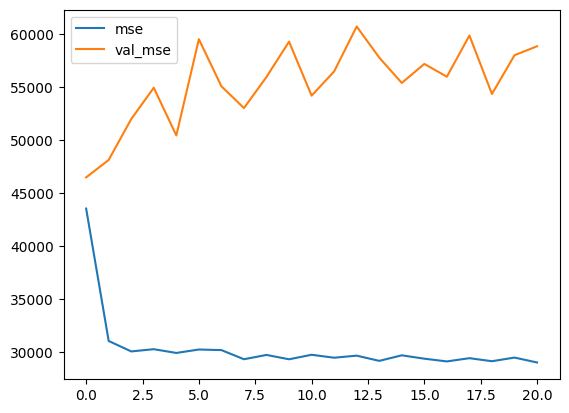

206/206 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step    
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


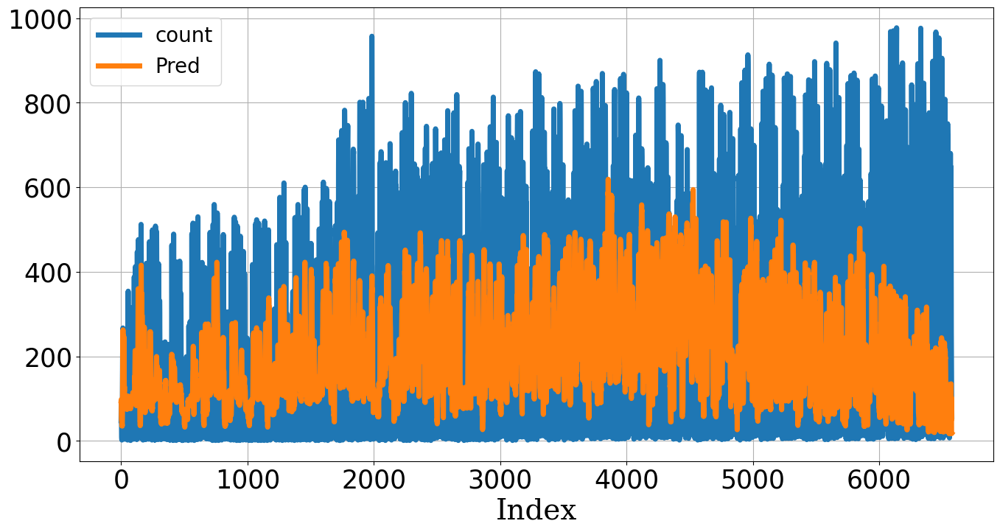

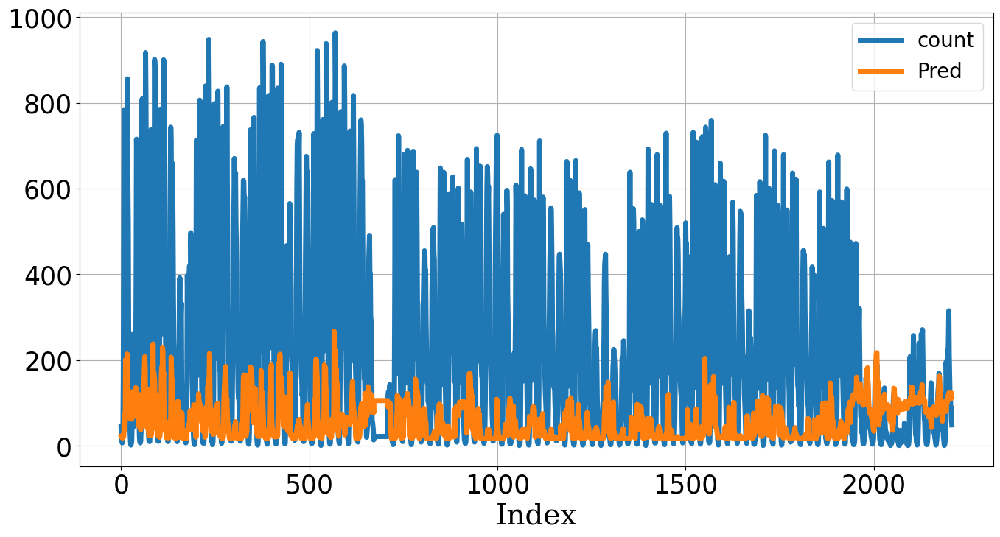

,MAE,MSE,MAPE
Train,132.67,"33,134.33",4.16
Test,179.51,"64,979.85",1.96


In [26]:
# 하이퍼파라미터
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 20
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BikeSharing_MLP.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1],))   
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

206/206 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step   
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


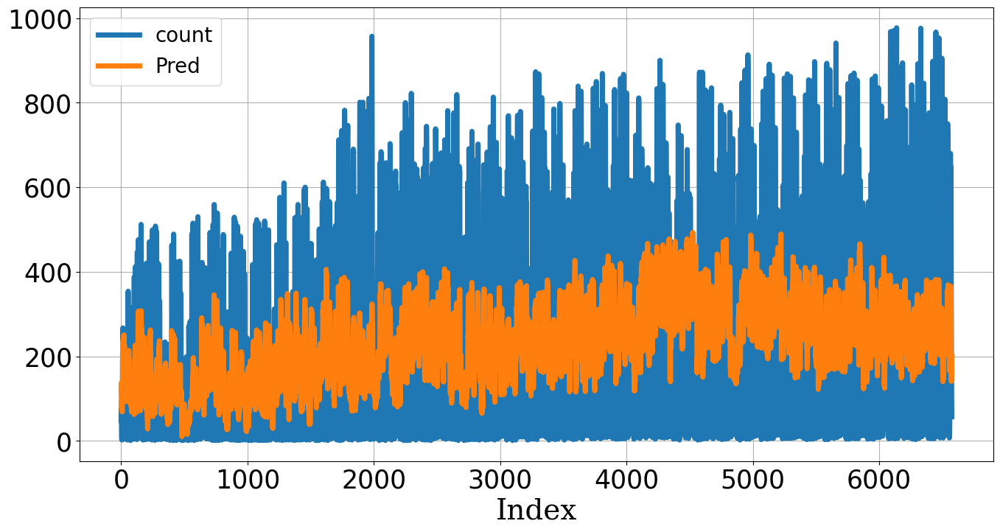

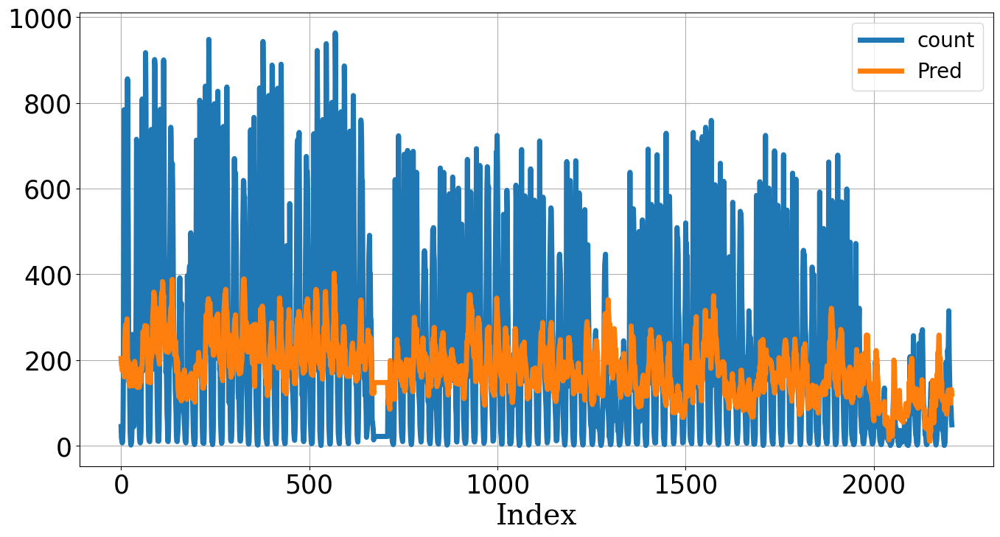

,MAE,MSE,MAPE
Train,140.42,"32,947.63",5.32
Test,131.54,"32,631.47",4.40


In [27]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## CNN

<center><img src='Image/Expert/CNN_Example.webp' width='900'></center>

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0
X_train: (6576, 8, 1) Y_train: (6576, 1)
X_test: (2208, 8, 1) Y_test: (2208, 1)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 8, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d (Conv1D)                 │ (None, 8, 128)         │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 4, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 4, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 4, 64)          │        24,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 2, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 2, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,313 (114.50 KB)

 Trainable params: 29,313 (114.50 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  47%|█████████████████████████████▌                                 | 47/100 [00:21<00:18,  2.80it/s]

Epoch 47: early stopping


Training Progress:  47%|█████████████████████████████▌                                 | 47/100 [00:21<00:24,  2.17it/s]


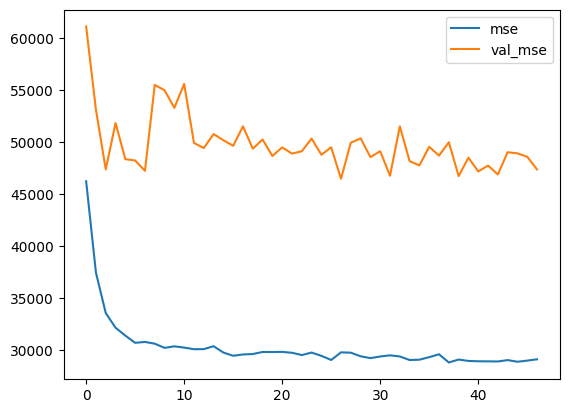

206/206 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step    
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


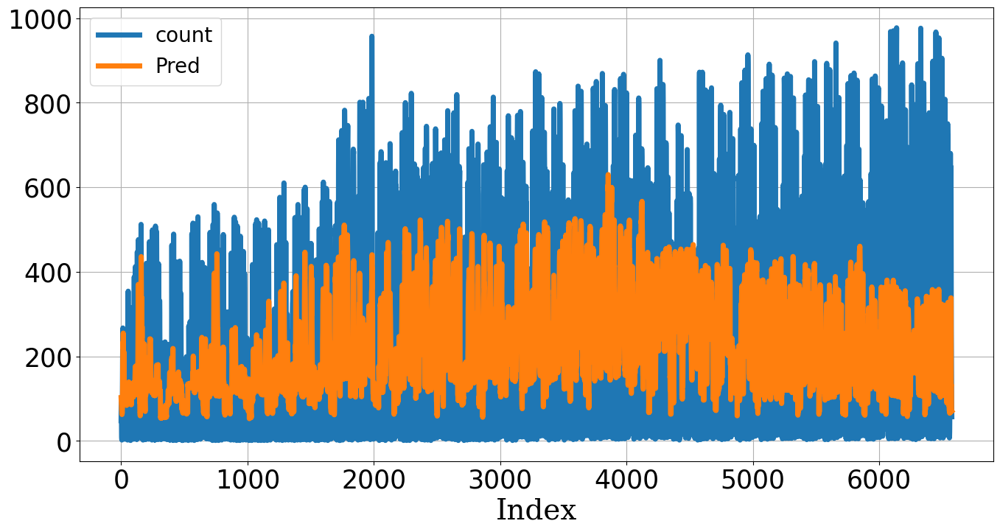

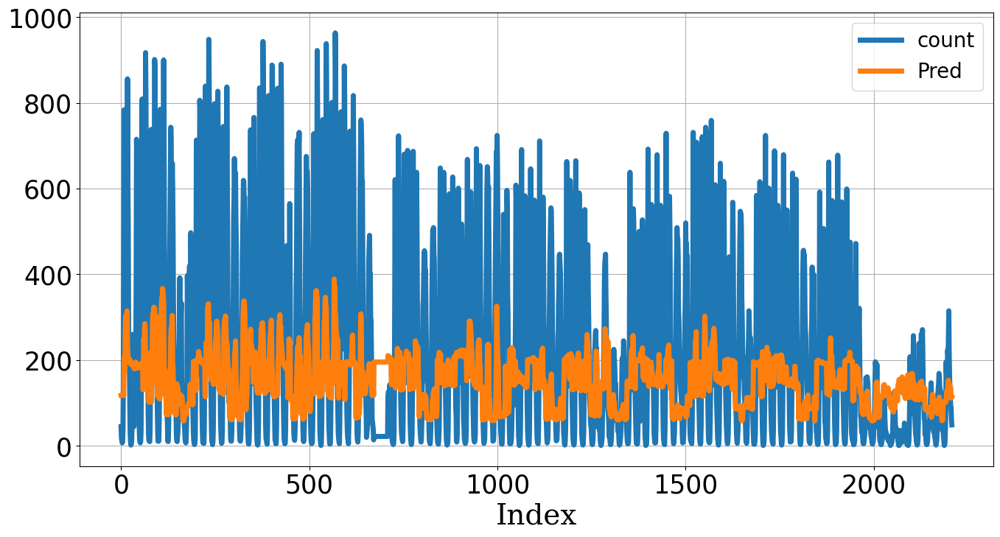

,MAE,MSE,MAPE
Train,131.75,"30,474.65",4.73
Test,142.83,"38,887.60",4.60


In [28]:
# 하이퍼파라미터
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 20
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BikeSharing_CNN.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

# Reshape
X_train = X_train.reshape(-1, X_train.shape[1], 1)
X_test = X_test.reshape(-1, X_test.shape[1], 1)
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))   
hiddens = Conv1D(128, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(inputs)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Conv1D(64, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION)(hiddens)  
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

206/206 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step   
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


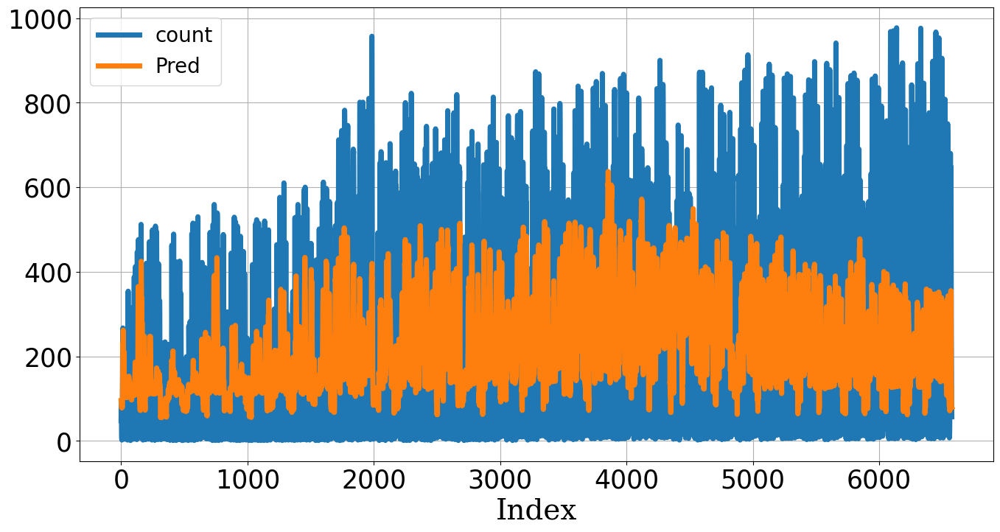

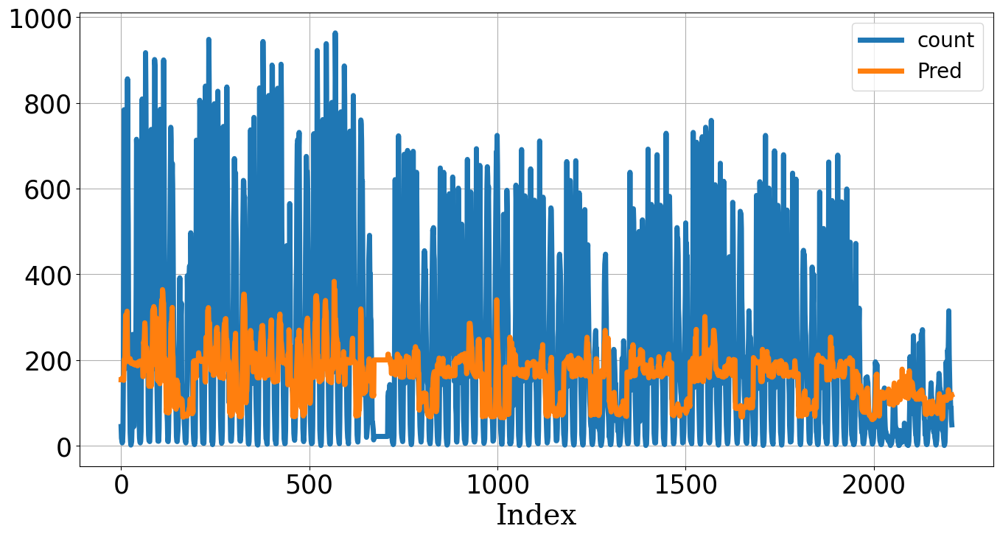

,MAE,MSE,MAPE
Train,131.90,"30,466.17",4.80
Test,141.07,"37,412.17",4.80


In [29]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## Data Reshaping

- **종속변수 Y와 독립변수 X의 전처리 필요!**

<center><img src='Image/Expert/Reshape_2Dto3DSeq.png' width='1100'></center>

In [30]:
# sequence 데이터 추출 및 변환
seq_length = 12
X_reshape, Y_reshape = [], []
for index in range(len(X_train) - seq_length + 1):
    X_reshape.append(np.array(X_train[index: index + seq_length]))    # sequence 길이의 row 선택후 붙이기
    Y_reshape.append(np.ravel(Y_train[index + seq_length - 1:index + seq_length]))    # sequence 길이를 제외하고 1개씩 붙이기
    
# arrange
X_reshape, Y_reshape = np.array(X_reshape), np.array(Y_reshape)
Y_reshape = pd.DataFrame(Y_reshape, index=Y_train.index[seq_length-1:], columns=Y_train.columns)
print('origin X: ', X_train.shape, '-> reshape X: ', X_reshape.shape)
print('origin Y: ', Y_train.shape, '-> reshape Y: ', Y_reshape.shape)

origin X:  (6576, 8, 1) -> reshape X:  (6565, 12, 8, 1)
origin Y:  (6576, 1) -> reshape Y:  (6565, 1)


In [31]:
# reshape 함수화
def reshape_2Dto3Dseq(df_X, df_Y, seq_length):
    # generate sequence
    X_reshape, Y_reshape = [], []
    for index in range(len(df_X) - seq_length + 1):
        X_reshape.append(np.array(df_X[index: index + seq_length]))    # sequence 길이의 row 선택후 붙이기
        Y_reshape.append(np.ravel(df_Y[index + seq_length - 1:index + seq_length]))    # sequence 길이를 제외하고 1개씩 붙이기
    
    # arrange
    X_reshape, Y_reshape = np.array(X_reshape), np.array(Y_reshape)
    Y_reshape = pd.DataFrame(Y_reshape, index=df_Y.index[seq_length-1:], columns=df_Y.columns)
    
    print('origin X: ', df_X.shape, '-> reshape X: ', X_reshape.shape)
    print('origin Y: ', df_Y.shape, '-> reshape Y: ', Y_reshape.shape)
    
    return X_reshape, Y_reshape

SEQUENCE=12
X, Y = reshape_2Dto3Dseq(X_train, Y_train, seq_length=SEQUENCE)

origin X:  (6576, 8, 1) -> reshape X:  (6565, 12, 8, 1)
origin Y:  (6576, 1) -> reshape Y:  (6565, 1)


In [32]:
# train & test 형태 변경
X, Y = reshape_2Dto3Dseq(np.concatenate((X_train, X_test), axis=0),
                         pd.concat([Y_train, Y_test], axis=0), SEQUENCE)
test_length = Y_test.shape[0]
X_train, Y_train = X[:-test_length,:,:], Y.iloc[:-test_length,:]
X_test, Y_test = X[-test_length:,:,:], Y.iloc[-test_length:,:]
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)
## 데이터 백업
X_trprep3D, X_teprep3D = X_train.copy(), X_test.copy()
Y_trprep3D, Y_teprep3D = Y_train.copy(), Y_test.copy()

origin X:  (8784, 8, 1) -> reshape X:  (8773, 12, 8, 1)
origin Y:  (8784, 1) -> reshape Y:  (8773, 1)
X_train: (6565, 12, 8, 1) Y_train: (6565, 1)
X_test: (2208, 12, 8, 1) Y_test: (2208, 1)


## RNN

<center><img src='Image/Expert/DL_RNN_UnfoldFold.PNG' width='600'></center>

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0
origin X:  (8784, 8) -> reshape X:  (8773, 12, 8)
origin Y:  (8784, 1) -> reshape Y:  (8773, 1)
X_train: (6565, 12, 8) Y_train: (6565, 1)
X_test: (2208, 12, 8) Y_test: (2208, 1)


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 12, 8)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn (SimpleRNN)          │ (None, 12, 128)        │        17,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 12, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_1 (SimpleRNN)        │ (None, 12, 64)         │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 12, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 768)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │           769 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 30,657 (119.75 KB)

 Trainable params: 30,657 (119.75 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  70%|████████████████████████████████████████████                   | 70/100 [00:40<00:14,  2.13it/s]

Epoch 70: early stopping


Training Progress:  70%|████████████████████████████████████████████                   | 70/100 [00:40<00:17,  1.74it/s]


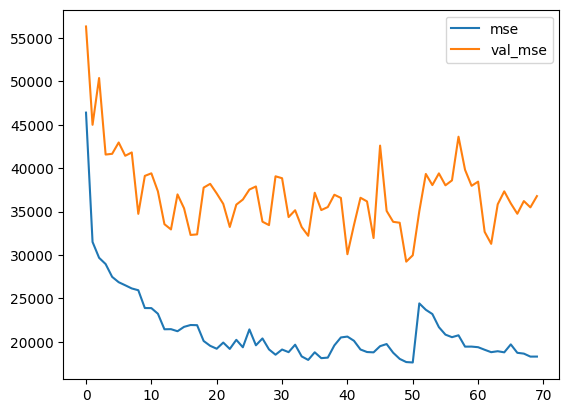

206/206 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step    
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


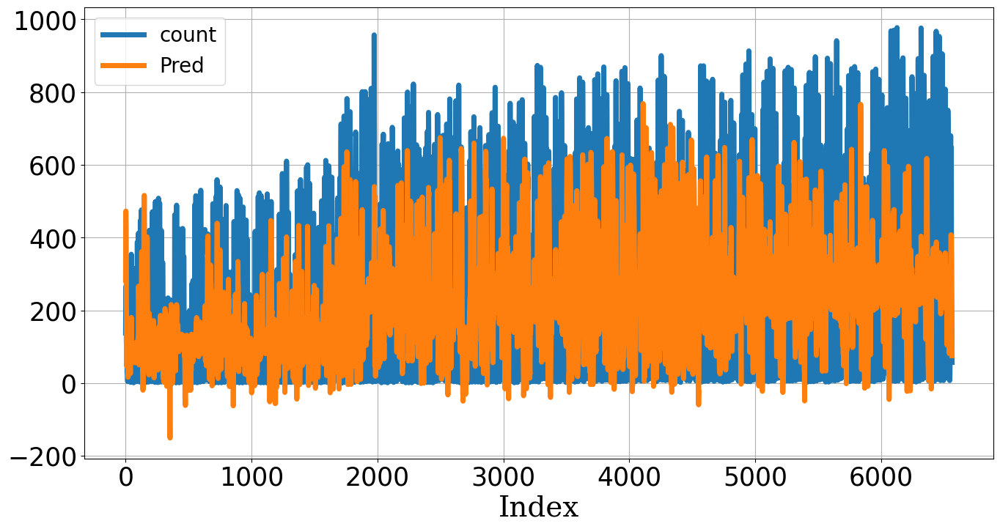

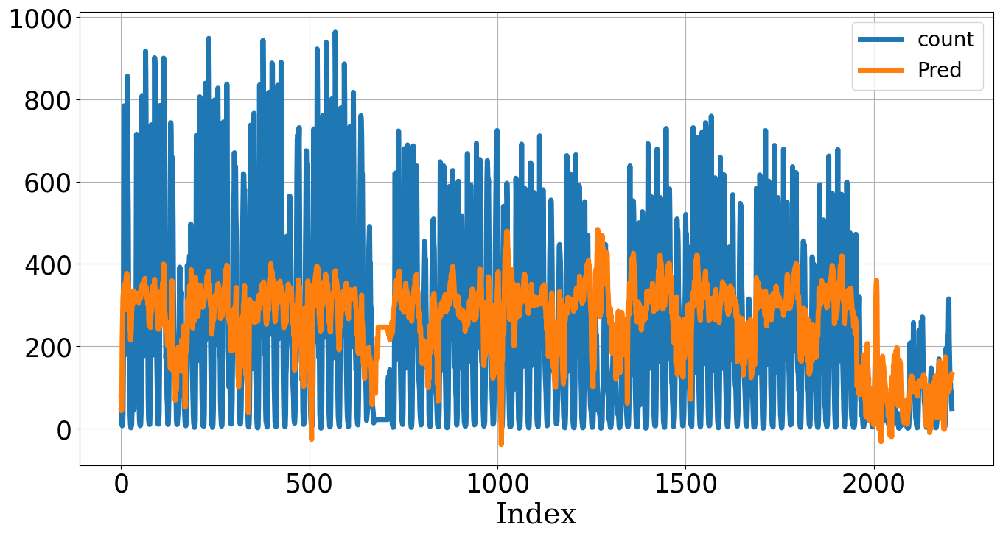

,MAE,MSE,MAPE
Train,105.59,"22,537.66",3.32
Test,152.22,"35,459.14",6.80


In [33]:
# 하이퍼파라미터
SEQUENCE=12
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 20
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BikeSharing_RNN.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

# Reshape
X, Y = reshape_2Dto3Dseq(np.concatenate((X_train, X_test), axis=0),
                         pd.concat([Y_train, Y_test], axis=0), SEQUENCE)
test_length = Y_test.shape[0]
X_train, Y_train = X[:-test_length,:,:], Y.iloc[:-test_length,:]
X_test, Y_test = X[-test_length:,:,:], Y.iloc[-test_length:,:]
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
hiddens = SimpleRNN(128, return_sequences=True, 
                    activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = SimpleRNN(64, return_sequences=True, 
                    activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

206/206 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step   
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


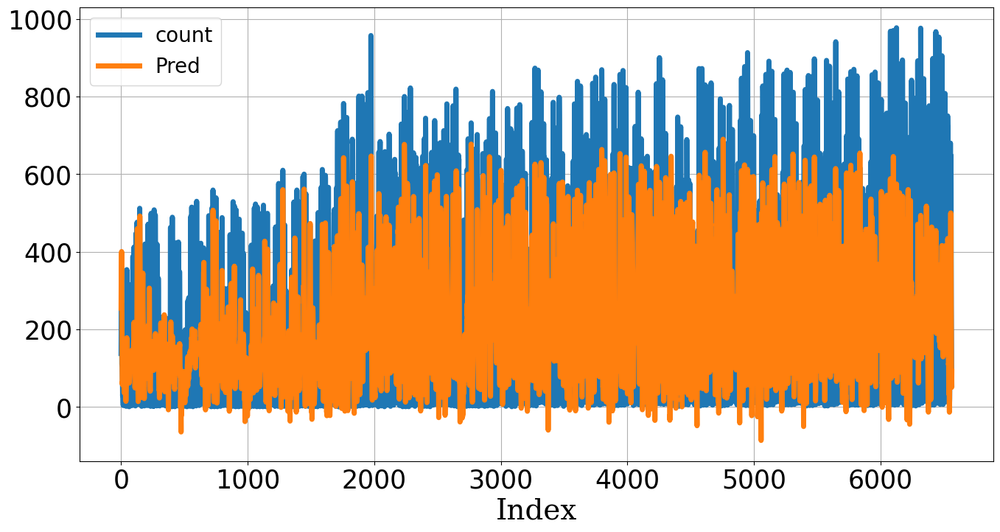

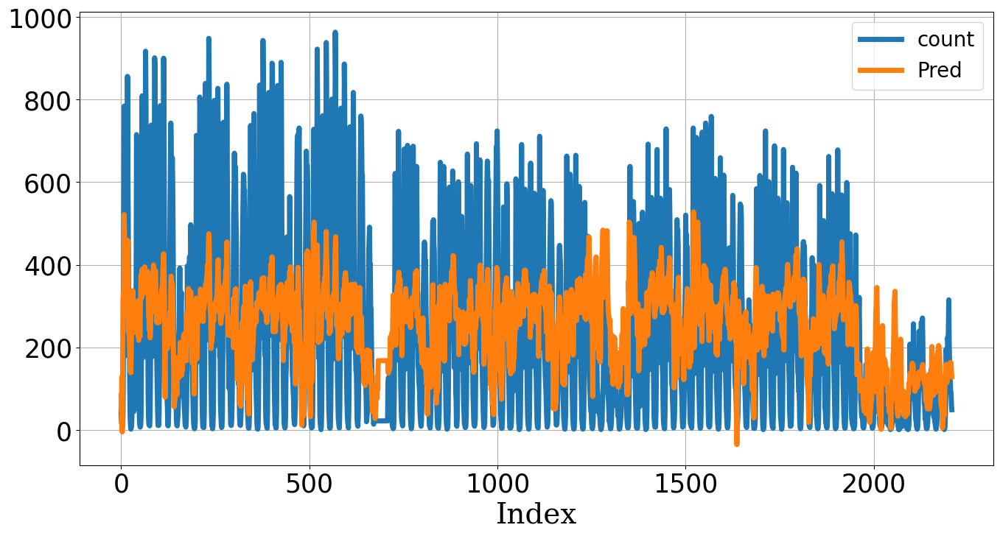

,MAE,MSE,MAPE
Train,94.77,"18,388.80",2.74
Test,143.90,"31,897.16",6.47


In [34]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## LSTM

<center><img src='Image/Expert/DL_RNN_Operation.PNG' width='700'>(http://colah.github.io/posts/2015-08-Understanding-LSTMs/)</center>

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0
origin X:  (8784, 8) -> reshape X:  (8773, 12, 8)
origin Y:  (8784, 1) -> reshape Y:  (8773, 1)
X_train: (6565, 12, 8) Y_train: (6565, 1)
X_test: (2208, 12, 8) Y_test: (2208, 1)


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 12, 8)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 12, 128)        │        70,144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 12, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 12, 64)         │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 12, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 768)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           769 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 120,321 (470.00 KB)

 Trainable params: 120,321 (470.00 KB)

 Non-trainable params: 0 (0.00 B)

2025-04-07 23:29:52.830286: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_78', 128 bytes spill stores, 128 bytes spill loads

2025-04-07 23:29:52.831333: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_78', 100 bytes spill stores, 100 bytes spill loads

2025-04-07 23:29:52.937882: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_78', 24 bytes spill stores, 24 bytes spill loads

Training Progress: 100%|██████████████████████████████████████████████████████████████| 100/100 [00:59<00:00,  1.68it/s]


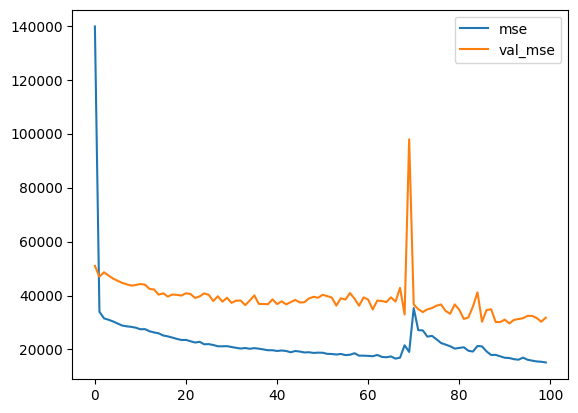

206/206 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step    
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


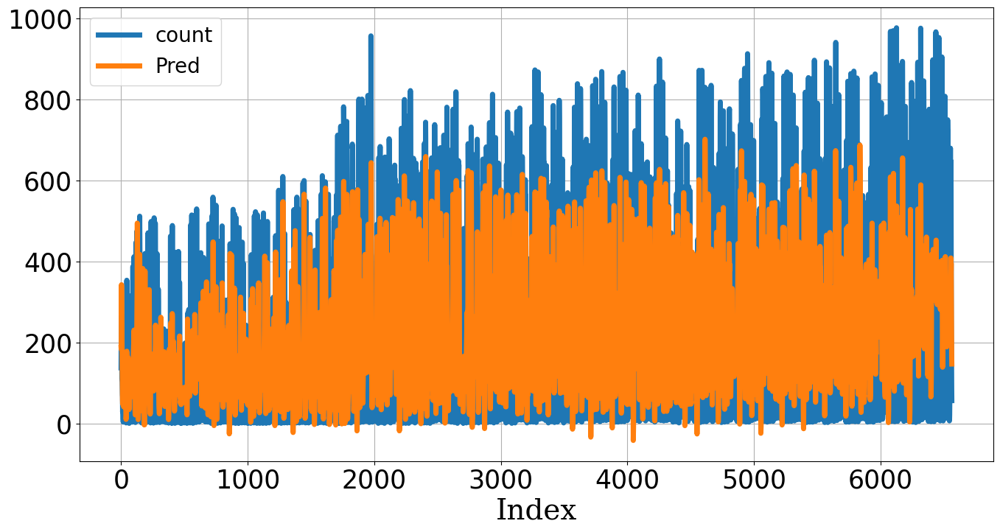

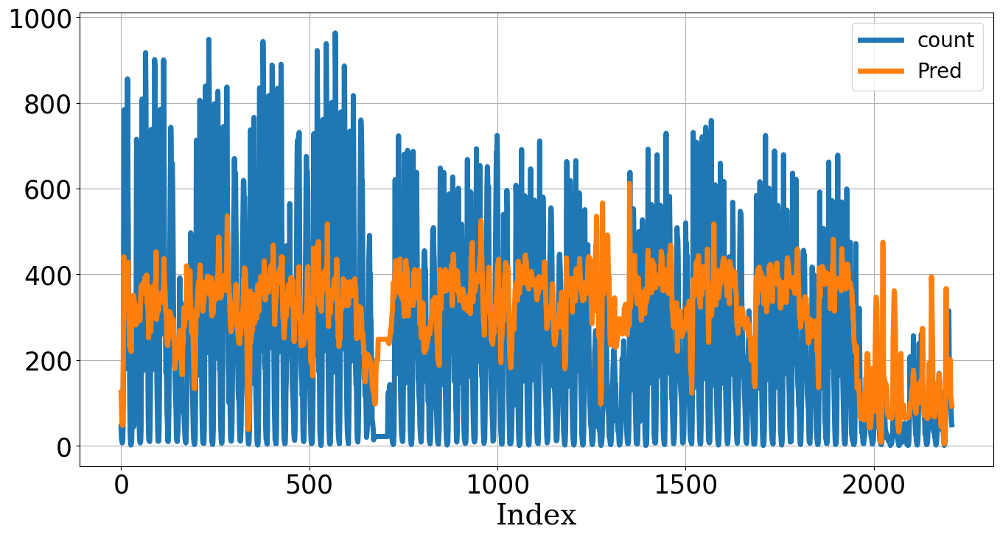

,MAE,MSE,MAPE
Train,90.81,"17,739.98",2.48
Test,173.90,"42,606.62",8.07


In [35]:
# 하이퍼파라미터
SEQUENCE=12
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 20
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BikeSharing_LSTM.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

# Reshape
X, Y = reshape_2Dto3Dseq(np.concatenate((X_train, X_test), axis=0),
                         pd.concat([Y_train, Y_test], axis=0), SEQUENCE)
test_length = Y_test.shape[0]
X_train, Y_train = X[:-test_length,:,:], Y.iloc[:-test_length,:]
X_test, Y_test = X[-test_length:,:,:], Y.iloc[-test_length:,:]
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
hiddens = LSTM(128, return_sequences=True, 
               activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = LSTM(64, return_sequences=True, 
               activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

206/206 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step    
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


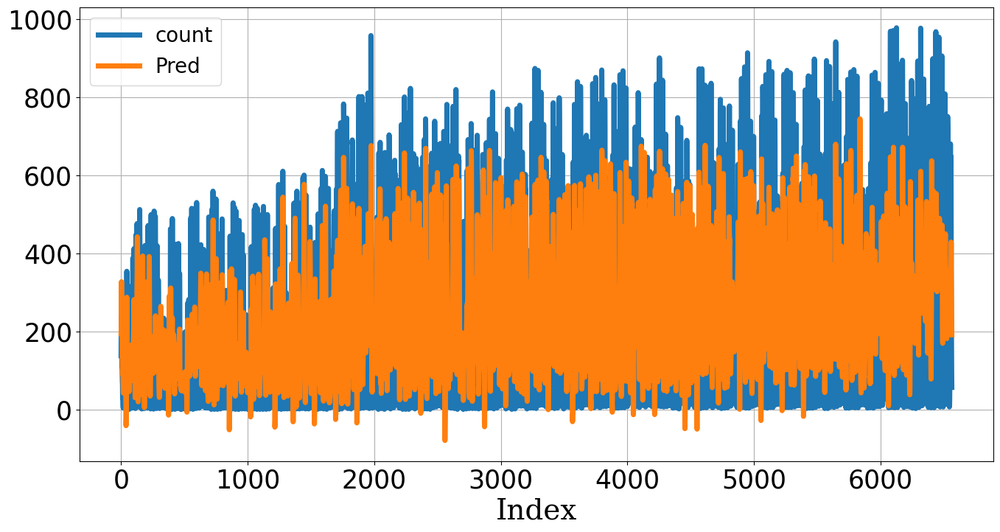

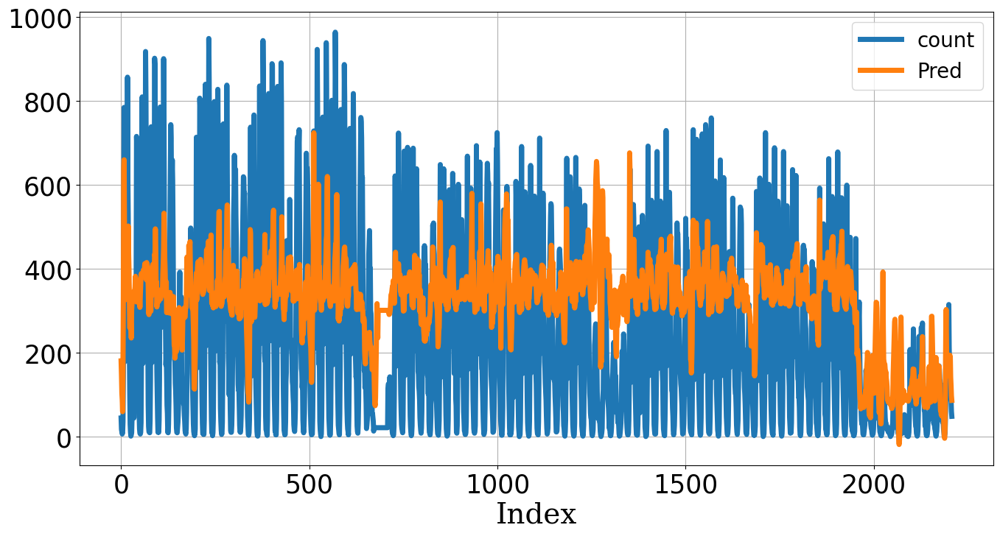

,MAE,MSE,MAPE
Train,93.87,"17,511.01",2.96
Test,178.95,"44,024.52",8.33


In [36]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## GRU

<center><img src='Image/Expert/DL_LSTM_GRU.png' width='700'>(https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21)</center>

---------------train----------------
normalized X:  (6576, 8) 0.0 1.0
----------------test----------------
normalized X:  (2208, 8) 0.0 1.0
origin X:  (8784, 8) -> reshape X:  (8773, 12, 8)
origin Y:  (8784, 1) -> reshape Y:  (8773, 1)
X_train: (6565, 12, 8) Y_train: (6565, 1)
X_test: (2208, 12, 8) Y_test: (2208, 1)


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 12, 8)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru (GRU)                       │ (None, 12, 128)        │        52,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 12, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 12, 64)         │        37,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 12, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 768)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │           769 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 91,009 (355.50 KB)

 Trainable params: 91,009 (355.50 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  71%|████████████████████████████████████████████▋                  | 71/100 [00:42<00:10,  2.89it/s]

Epoch 71: early stopping


Training Progress:  71%|████████████████████████████████████████████▋                  | 71/100 [00:42<00:17,  1.67it/s]


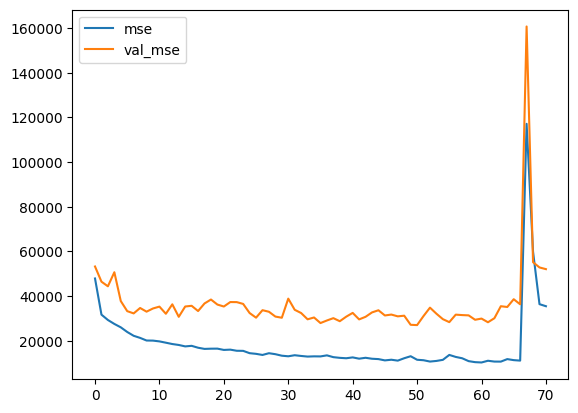

206/206 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step    
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


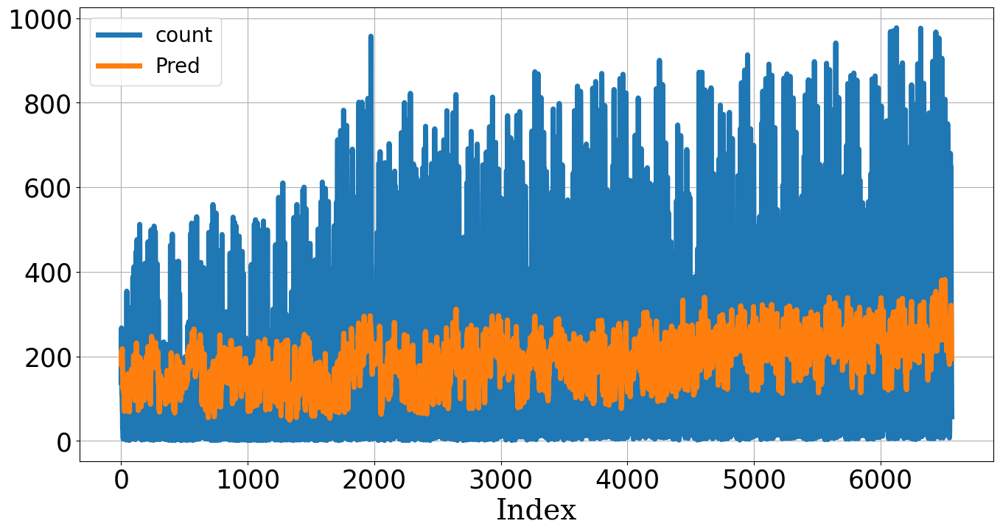

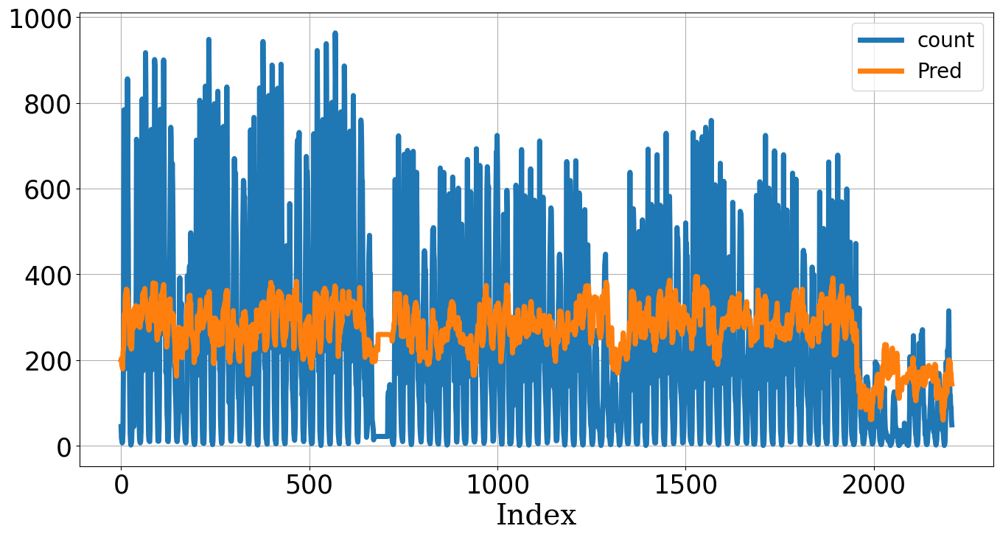

,MAE,MSE,MAPE
Train,145.24,"38,476.92",4.72
Test,157.50,"36,125.36",7.59


In [37]:
# 하이퍼파라미터
SEQUENCE=12
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 100
VERBOSE = 0
################
EARLYSTOP_PATIENT = 20
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BikeSharing_GRU.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','BikeSharingDemand','Bike_Sharing_Demand_Full.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_BikeSharing(df)

# Reshape
X, Y = reshape_2Dto3Dseq(np.concatenate((X_train, X_test), axis=0),
                         pd.concat([Y_train, Y_test], axis=0), SEQUENCE)
test_length = Y_test.shape[0]
X_train, Y_train = X[:-test_length,:,:], Y.iloc[:-test_length,:]
X_test, Y_test = X[-test_length:,:,:], Y.iloc[-test_length:,:]
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
hiddens = GRU(128, return_sequences=True, 
              activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = GRU(64, return_sequences=True, 
              activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

206/206 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step    
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


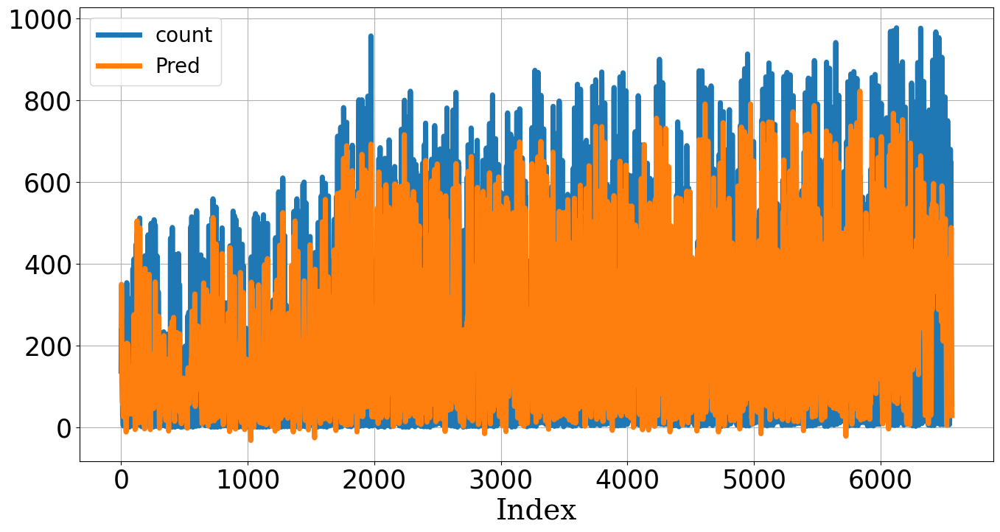

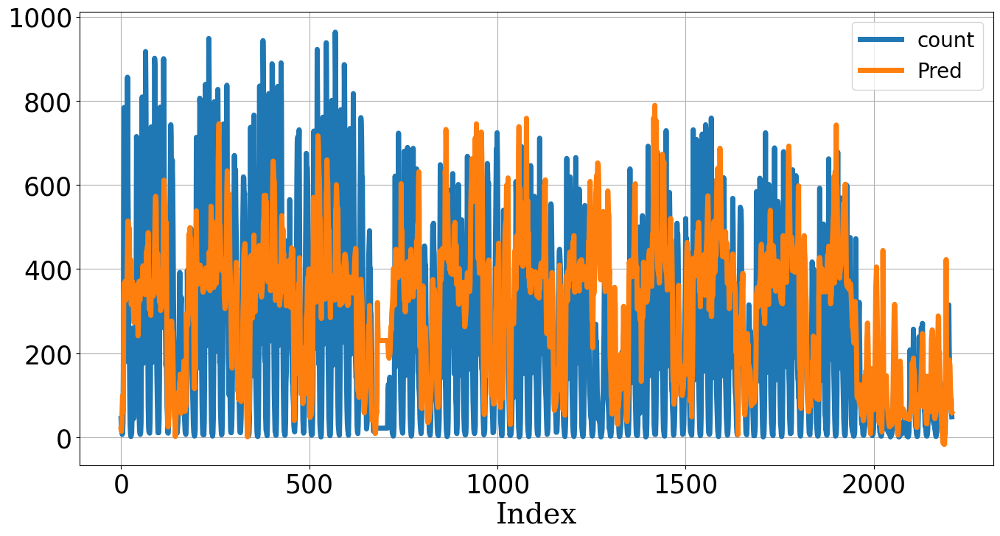

,MAE,MSE,MAPE
Train,80.03,"14,125.80",1.94
Test,180.43,"53,555.49",8.11


In [38]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## Result Summary

MLP
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step   
CNN
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step   
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step   
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step   


,MAE,MSE,MAPE
MLP,131.54,"32,631.47",4.40
CNN,141.07,"37,412.17",4.80
RNN,143.90,"31,897.16",6.47
LSTM,178.95,"44,024.52",8.33
GRU,180.43,"53,555.49",8.11


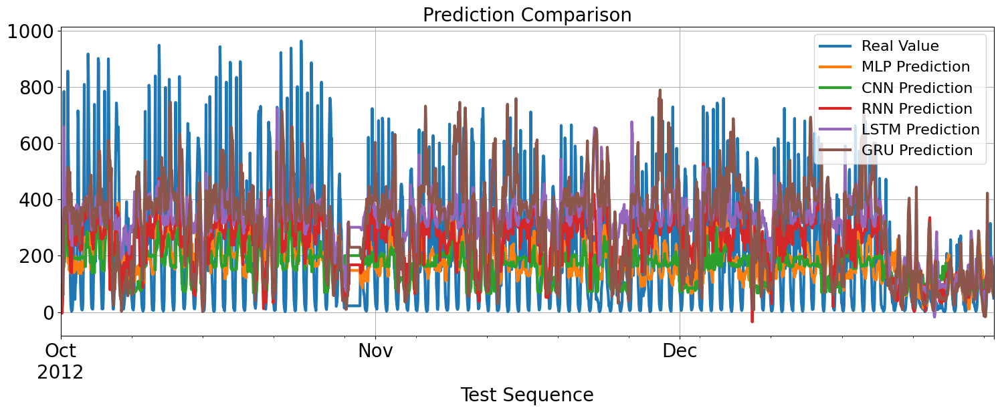

In [39]:
# 저장 모델 불러오기
modelnames = ['MLP', 'CNN', 'RNN', 'LSTM', 'GRU']

# 결과 정리
Y_pred, Score_final = Y_test.copy(), pd.DataFrame()
for each in modelnames:
    FILENAME = os.path.join(os.getcwd(),'Model','BikeSharing_'+each+'.keras')
    
    # 베스트 모델 로딩
    model = load_model(FILENAME)
    
    ## 예측하기
    if each in ['MLP', 'CNN']:
        print(each)
        Y_tepred = pd.DataFrame(model.predict(X_teprep2D), 
                                index=Y_teprep2D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg( Y_teprep2D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
    else:
        Y_tepred = pd.DataFrame(model.predict(X_teprep3D), 
                                index=Y_teprep3D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg(Y_teprep3D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
  
# 정리
Y_pred.columns = ['Real Value']+[i+' Prediction' for i in modelnames]
Score_final.index = modelnames
    
# 결과 출력
display(Score_final)
Y_pred.plot(kind='line', figsize=(18,6), linewidth=3, fontsize=20,
            xlim=(Y_pred.index.min(),Y_pred.index.max()))
plt.title('Prediction Comparison', fontsize=20)
plt.xlabel('Test Sequence', fontsize=20)
plt.ylabel('', fontsize=20)
plt.legend(fontsize=16)
plt.grid()
plt.show()

# **Problem:** 마케팅매출액 예측

- **최종 사용변수 설명:**

| **변수** | **설명** |
|:---:|:---:|
| **DATE** | 날짜 |
| **SALES** | 매출액 |
| **SMS** | 문자 마케팅 |
| **Newspaper ads** | 신문광고 마케팅 |
| **Radio** | 라디오 마케팅 |
| **TV** | TV 마케팅 |
| **Pay Per Click** | 클릭유도 마케팅 |
| **Offline** | 오프라인 마케팅 |
| **Contest** | 콘테스트 마케팅 |
| **Coupons** | 쿠폰 마케팅 |
| **Internet** | 인터넷 마케팅 |
| **Email to customers** | 이메일 마케팅 |
| **Facebook Post** | 페이스북게시물 마케팅 |
| **Facebook ads** | 페이스북광고 마케팅 |
| **Sponsership** | 스폰서 마케팅 |
| **Newsletter article** | 소식지 마케팅 |
| **Direct mail** | 직접홍보 마케팅 |
| **Poster** | 포스터 마케팅 |

## Data Preprocessing

In [40]:
# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 시간정보가 문자로 인식되는 경우 datetime 형식으로 변환하기
if 'DATE' in df.columns:
    df['DATE'] = pd.to_datetime(df['DATE'])

# df의 index를 시간정보로 변경하기
if df.index.dtype == 'int64':
    df.set_index('DATE', inplace=True)

# 최종적으로 데이터의 시간정보 빈도를 결정하고 NaN 값을 채운 후
df = df.asfreq('D', method='ffill')

# 종속변수와 독립변수 결정
Y_colname = ['SALES ($)']
X_remove = ['DIVISION', 'DEMAND (No. of Handsets)', 'SALES (No. of Handsets)', 'Variables,Adstock,Power,Lag']
X_colname = [x for x in df.columns if x not in Y_colname+X_remove]

# 정리
df = df.loc[df.index<'2016-01-01', Y_colname+X_colname]
Y_colname = ['SALES']
X_colname = [x.split('_')[len(x.split('_'))-1] for x in X_colname]
df.columns = Y_colname + X_colname
df

,SALES,SMS,Newspaper ads,Radio,TV,Pay Per Click,Offline,Contest,Coupons,Internet,Email to customers,Facebook Post,Facebook ads,Sponsership,Newsletter article,Direct mail,Poster
DATE,,,,,,,,,,,,,,,,,
2010-01-01,"1,533,299.16",77.48,14.10,112.34,"1,479.46",95.33,11.84,10.30,9.70,722.57,91.00,276.36,756.59,181.36,72.77,13.05,27.05
2010-01-02,"1,681,816.96",73.48,13.30,105.71,"1,369.89",114.96,27.80,5.52,10.65,717.86,111.91,291.32,860.14,208.63,376.86,32.95,158.45
2010-01-03,"1,353,028.79",80.61,13.20,108.77,"1,428.06",113.09,0.00,6.62,7.53,653.33,94.64,282.73,751.95,181.20,51.77,6.59,21.45
2010-01-04,"1,488,860.84",65.93,12.72,93.31,"1,309.35",72.44,0.00,10.16,4.78,622.10,98.59,306.32,749.45,194.33,73.50,7.23,25.05
2010-01-05,"1,633,299.16",77.48,14.10,112.34,"1,479.46",95.33,11.84,10.30,9.70,722.57,91.00,276.36,756.59,181.36,72.77,13.05,27.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-27,"8,499,431.32",42.83,11.44,77.91,"1,161.94",132.12,15.16,0.48,3.99,"2,675.61",168.14,304.18,"1,378.09",249.80,91.32,13.27,26.18
2015-12-28,"7,480,844.15",37.92,11.89,62.97,"1,251.25",85.02,20.98,0.51,4.29,"2,705.77",178.97,381.93,"1,466.82",313.65,123.30,14.13,32.87
2015-12-29,"7,312,018.52",38.93,10.69,79.35,"1,090.94",42.85,36.35,0.50,4.16,"4,268.16",131.80,378.63,"1,080.27",310.94,109.67,10.40,32.58


In [41]:
# Train & Test 분할
df_train = df.loc[df.index < '2015-01-01',:]
df_test = df.loc[df.index >= '2015-01-01',:]

# X_train, Y_train, X_test, Y_test 분할
Y_train = df_train[Y_colname]/1000
X_train = df_train[X_colname]
Y_test = df_test[Y_colname]/1000
X_test = df_test[X_colname]

# 데이터 스케일링
scaler = preprocessing.MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
print('---------------train----------------')
print('normalized X: ', X_train.shape, X_train.min(), X_train.max())
print('----------------test----------------')
print('normalized X: ', X_test.shape, X_test.min(), X_test.max())

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0


In [42]:
# 데이터 전처리 함수화
def preprocessing_MarketingSales(df):
    # 시간정보가 문자로 인식되는 경우 datetime 형식으로 변환하기
    if 'DATE' in df.columns:
        df['DATE'] = pd.to_datetime(df['DATE'])

    # df의 index를 시간정보로 변경하기
    if df.index.dtype == 'int64':
        df.set_index('DATE', inplace=True)

    # 최종적으로 데이터의 시간정보 빈도를 결정하고 NaN 값을 채운 후
    df = df.asfreq('D', method='ffill')

    # 종속변수와 독립변수 결정
    Y_colname = ['SALES ($)']
    X_remove = ['DIVISION', 'DEMAND (No. of Handsets)', 'SALES (No. of Handsets)', 'Variables,Adstock,Power,Lag']
    X_colname = [x for x in df.columns if x not in Y_colname+X_remove]

    # 정리
    df = df.loc[df.index<'2016-01-01', Y_colname+X_colname]
    Y_colname = ['SALES']
    X_colname = [x.split('_')[len(x.split('_'))-1] for x in X_colname]
    df.columns = Y_colname + X_colname
    
    # Train & Test 분할
    df_train = df.loc[df.index < '2015-01-01',:]
    df_test = df.loc[df.index >= '2015-01-01',:]

    # X_train, Y_train, X_test, Y_test 분할
    Y_train = df_train[Y_colname]/1000
    X_train = df_train[X_colname]
    Y_test = df_test[Y_colname]/1000
    X_test = df_test[X_colname]

    # 데이터 스케일링
    scaler = preprocessing.MinMaxScaler()
    scaler.fit(X_train)
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    print('---------------train----------------')
    print('normalized X: ', X_train.shape, X_train.min(), X_train.max())
    print('----------------test----------------')
    print('normalized X: ', X_test.shape, X_test.min(), X_test.max())
    
    return X_train, X_test, Y_train, Y_test

# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)
## 데이터 백업
X_trprep2D, X_teprep2D = X_train.copy(), X_test.copy()
Y_trprep2D, Y_teprep2D = Y_train.copy(), Y_test.copy()

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0


## MLP

<center><img src='Image/Expert/DL_MLP_Custom.PNG' width='500'></center>

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 128)            │         2,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,545 (49.00 KB)

 Trainable params: 12,545 (49.00 KB)

 Non-trainable params: 0 (0.00 B)

2025-04-07 23:31:50.018161: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_56', 12 bytes spill stores, 12 bytes spill loads

Training Progress:  21%|█████████████▍                                                 | 64/300 [00:18<00:34,  6.80it/s]

Epoch 64: early stopping


Training Progress:  21%|█████████████▍                                                 | 64/300 [00:18<01:07,  3.48it/s]


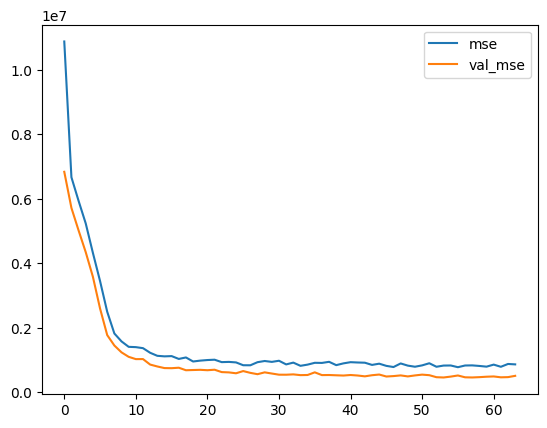

58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step  
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step


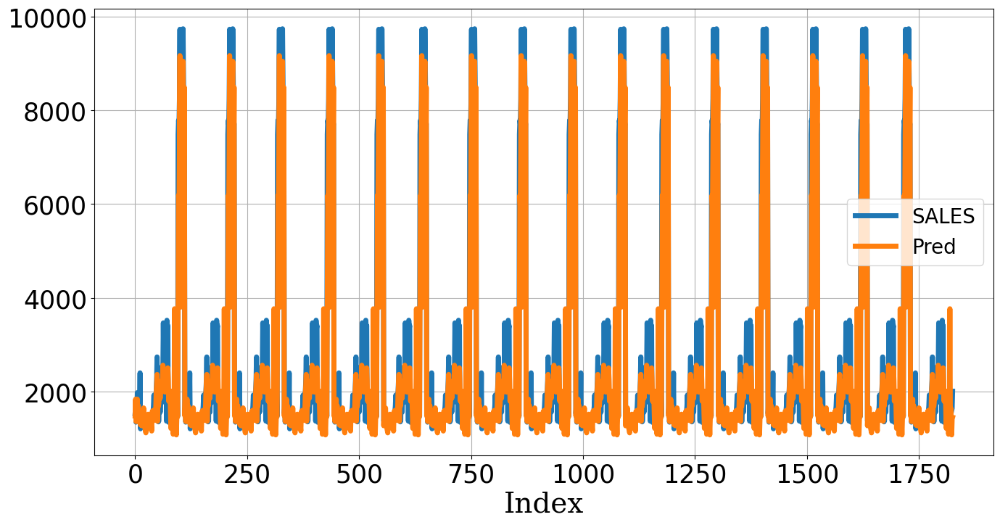

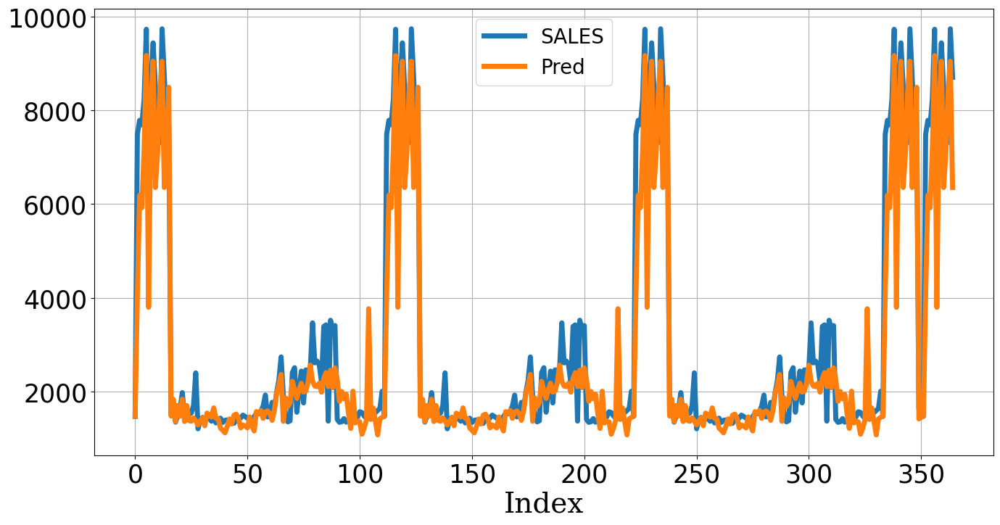

,MAE,MSE,MAPE
Train,435.76,"496,131.24",0.17
Test,499.15,"642,743.71",0.17


In [43]:
# 하이퍼파라미터
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 300
VERBOSE = 0
################
EARLYSTOP_PATIENT = 10
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','MarketingSales_MLP.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1],))   
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, 
                      validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step   
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


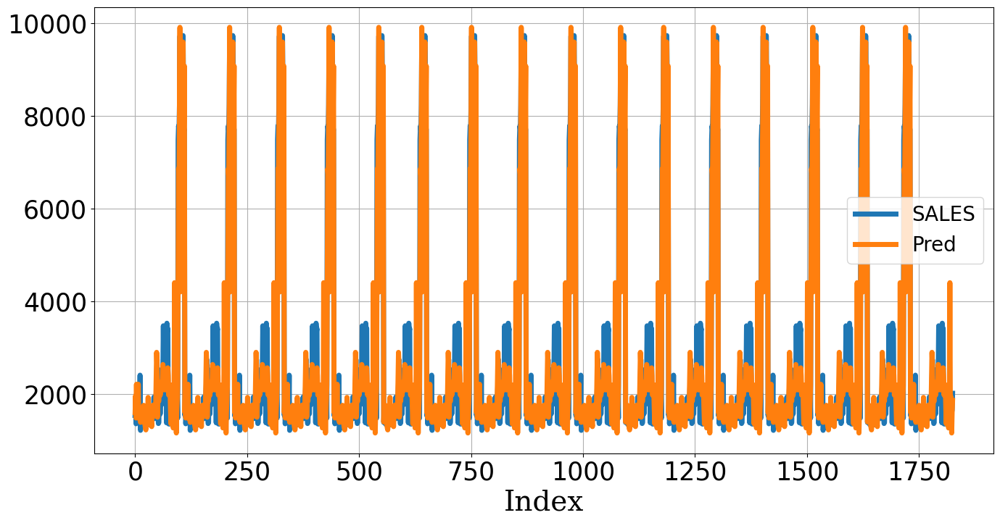

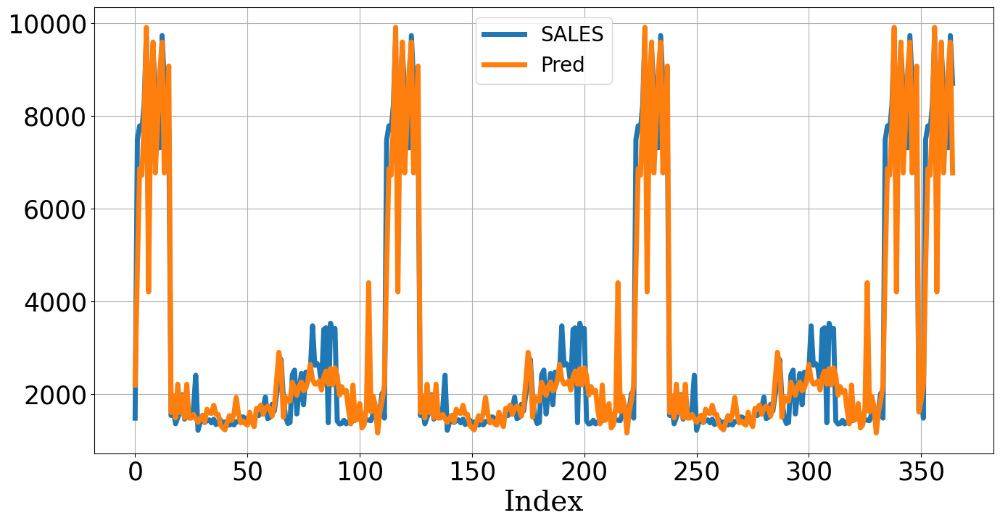

,MAE,MSE,MAPE
Train,421.63,"435,258.19",0.19
Test,460.49,"518,192.51",0.18


In [44]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## CNN

<center><img src='Image/Expert/CNN_Example.webp' width='900'></center>

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0
X_train: (1826, 16, 1) Y_train: (1826, 1)
X_test: (365, 16, 1) Y_test: (365, 1)


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 16, 1)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 16, 128)        │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 8, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 8, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 8, 64)          │        24,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 4, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 4, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 32)             │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,409 (130.50 KB)

 Trainable params: 33,409 (130.50 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  50%|███████████████████████████████▏                              | 151/300 [00:33<00:20,  7.31it/s]

Epoch 151: early stopping


Training Progress:  50%|███████████████████████████████▏                              | 151/300 [00:33<00:32,  4.54it/s]


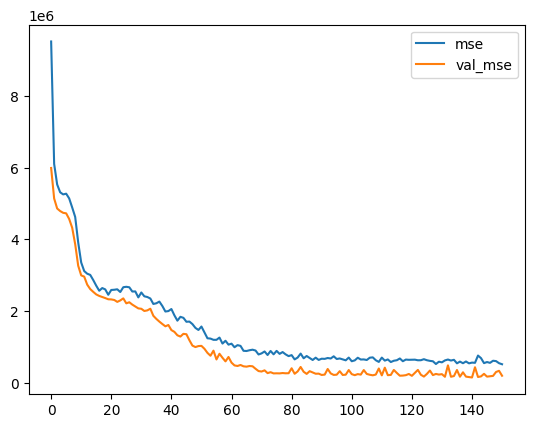

58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step   
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


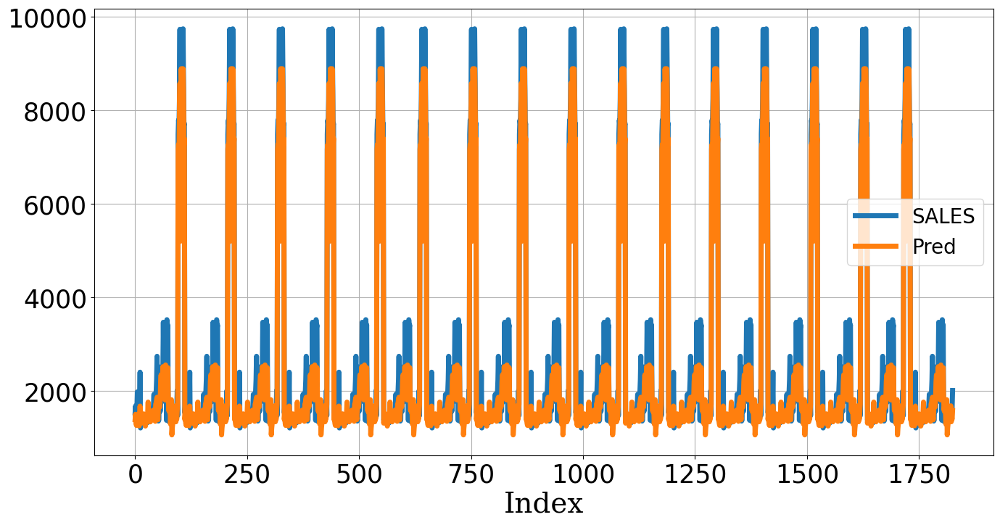

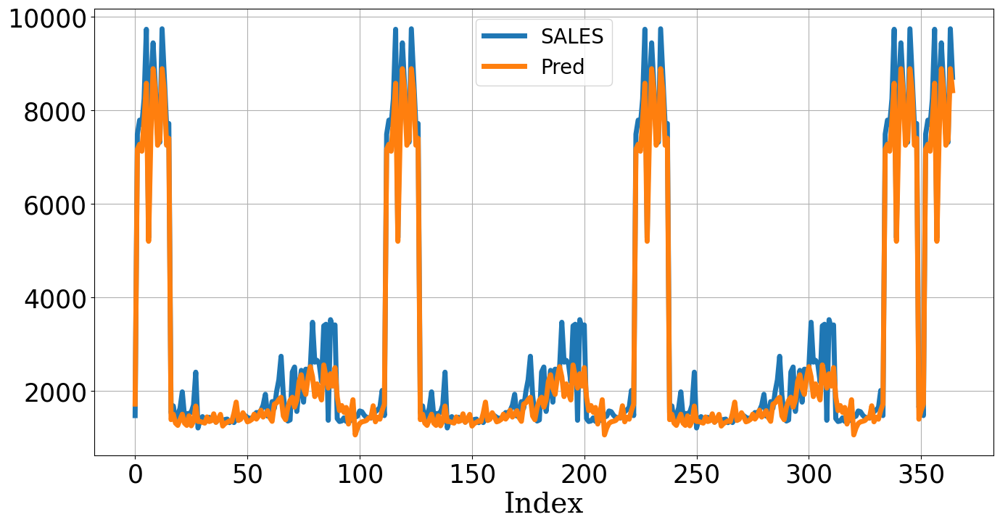

,MAE,MSE,MAPE
Train,302.04,"182,843.89",0.13
Test,314.78,"193,182.52",0.12


In [45]:
# 하이퍼파라미터
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 300
VERBOSE = 0
################
EARLYSTOP_PATIENT = 10
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','MarketingSales_CNN.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)

# Reshape
X_train = X_train.reshape(-1, X_train.shape[1], 1)
X_test = X_test.reshape(-1, X_test.shape[1], 1)
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))   
hiddens = Conv1D(128, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(inputs)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Conv1D(64, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION)(hiddens)  
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, 
                      validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step   
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


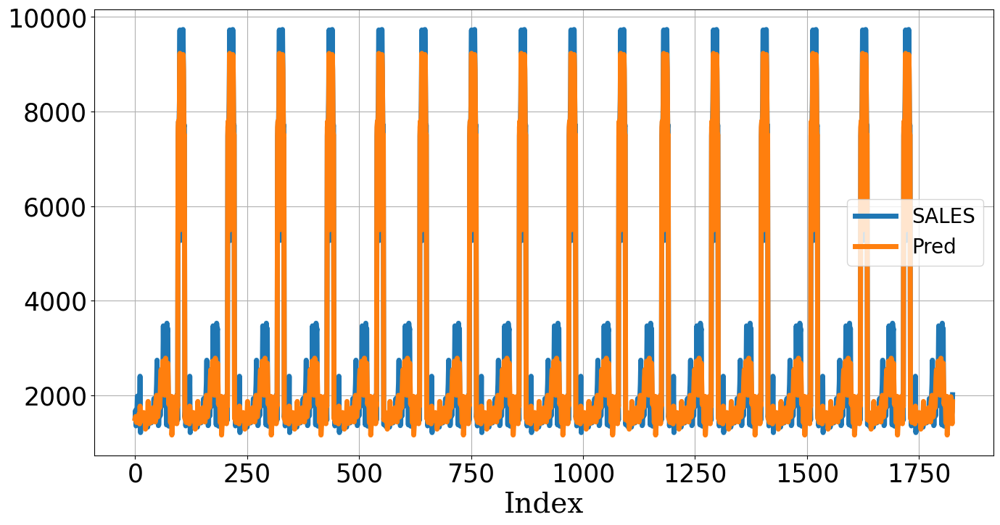

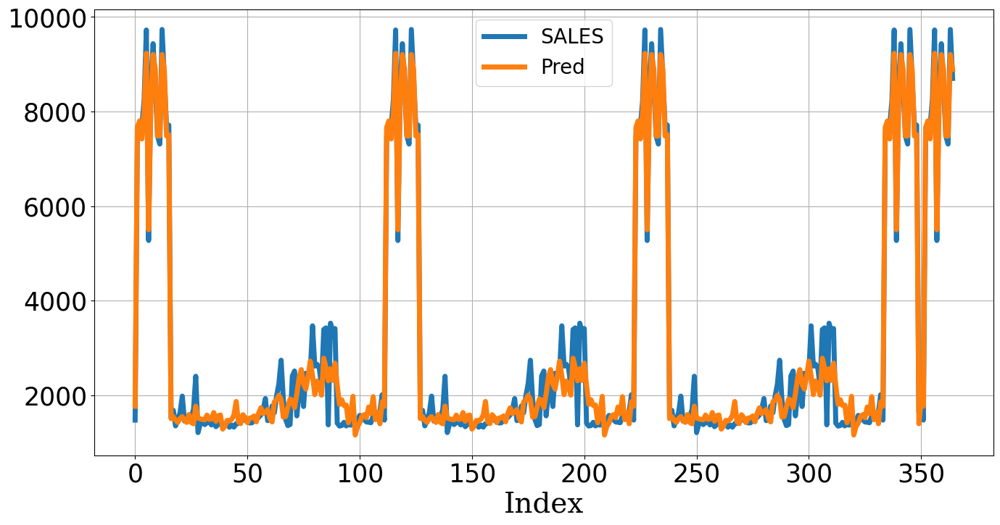

,MAE,MSE,MAPE
Train,273.36,"134,274.03",0.13
Test,269.34,"127,929.66",0.12


In [46]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## Data Reshaping

- **종속변수 Y와 독립변수 X의 전처리 필요!**

<center><img src='Image/Expert/Reshape_2Dto3DSeq.png' width='1100'></center>

In [47]:
# Reshape
SEQUENCE=7
X, Y = reshape_2Dto3Dseq(np.concatenate((X_train, X_test), axis=0),
                         pd.concat([Y_train, Y_test], axis=0), SEQUENCE)
test_length = Y_test.shape[0]
X_train, Y_train = X[:-test_length,:,:], Y.iloc[:-test_length,:]
X_test, Y_test = X[-test_length:,:,:], Y.iloc[-test_length:,:]
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)
## 데이터 백업
X_trprep3D, X_teprep3D = X_train.copy(), X_test.copy()
Y_trprep3D, Y_teprep3D = Y_train.copy(), Y_test.copy()

origin X:  (2191, 16, 1) -> reshape X:  (2185, 7, 16, 1)
origin Y:  (2191, 1) -> reshape Y:  (2185, 1)
X_train: (1820, 7, 16, 1) Y_train: (1820, 1)
X_test: (365, 7, 16, 1) Y_test: (365, 1)


## RNN

<center><img src='Image/Expert/DL_RNN_UnfoldFold.PNG' width='600'></center>

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0
origin X:  (2191, 16) -> reshape X:  (2185, 7, 16)
origin Y:  (2191, 1) -> reshape Y:  (2185, 1)
X_train: (1820, 7, 16) Y_train: (1820, 1)
X_test: (365, 7, 16) Y_test: (365, 1)


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 7, 16)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_2 (SimpleRNN)        │ (None, 7, 128)         │        18,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_3 (SimpleRNN)        │ (None, 7, 64)          │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 448)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 1)              │           449 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,361 (122.50 KB)

 Trainable params: 31,361 (122.50 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  38%|███████████████████████▌                                      | 114/300 [00:33<00:39,  4.76it/s]

Epoch 114: early stopping


Training Progress:  38%|███████████████████████▌                                      | 114/300 [00:33<00:54,  3.44it/s]


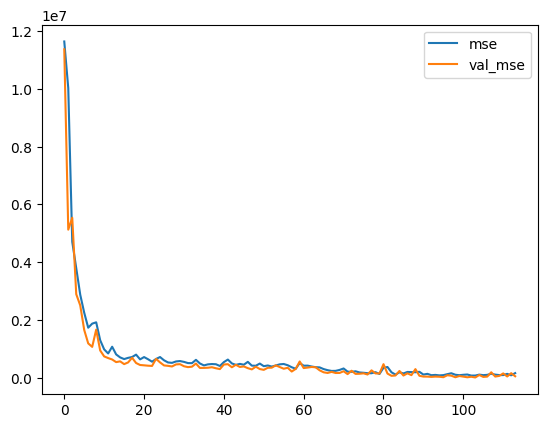

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step   
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


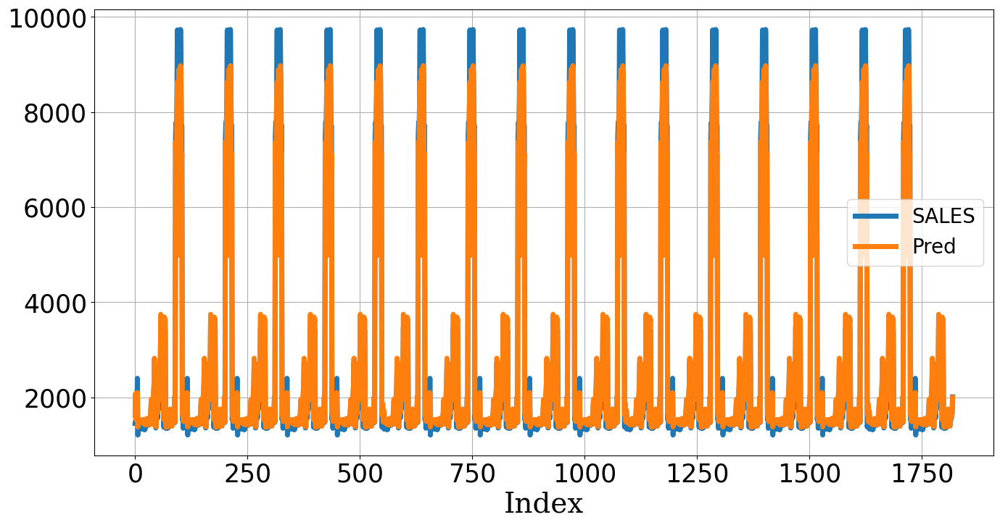

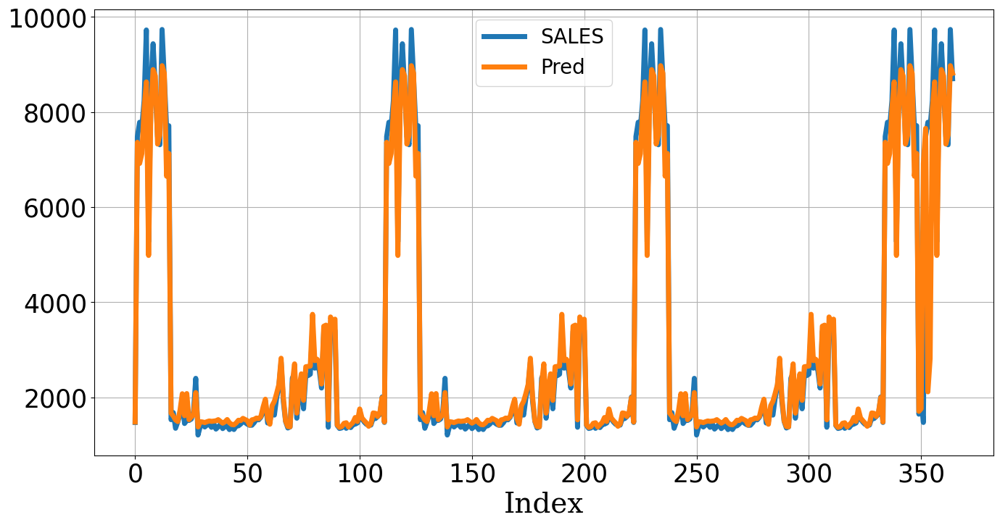

,MAE,MSE,MAPE
Train,150.66,"59,719.22",0.06
Test,214.31,"310,876.56",0.07


In [48]:
# 하이퍼파라미터
SEQUENCE=7
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 300
VERBOSE = 0
################
EARLYSTOP_PATIENT = 10
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','MarketingSales_RNN.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)

# Reshape
X, Y = reshape_2Dto3Dseq(np.concatenate((X_train, X_test), axis=0),
                         pd.concat([Y_train, Y_test], axis=0), SEQUENCE)
test_length = Y_test.shape[0]
X_train, Y_train = X[:-test_length,:,:], Y.iloc[:-test_length,:]
X_test, Y_test = X[-test_length:,:,:], Y.iloc[-test_length:,:]
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
hiddens = SimpleRNN(128, return_sequences=True, 
                    activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = SimpleRNN(64, return_sequences=True, 
                    activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step   
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


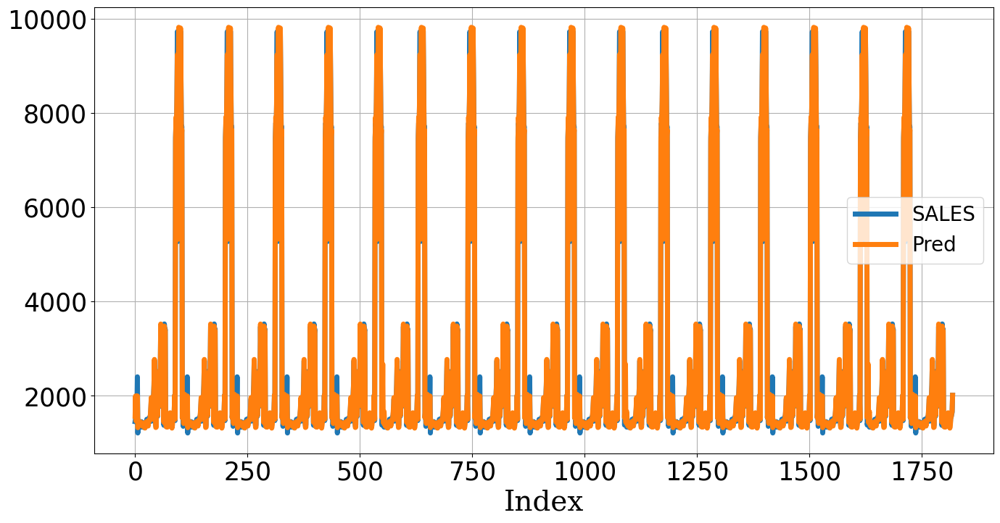

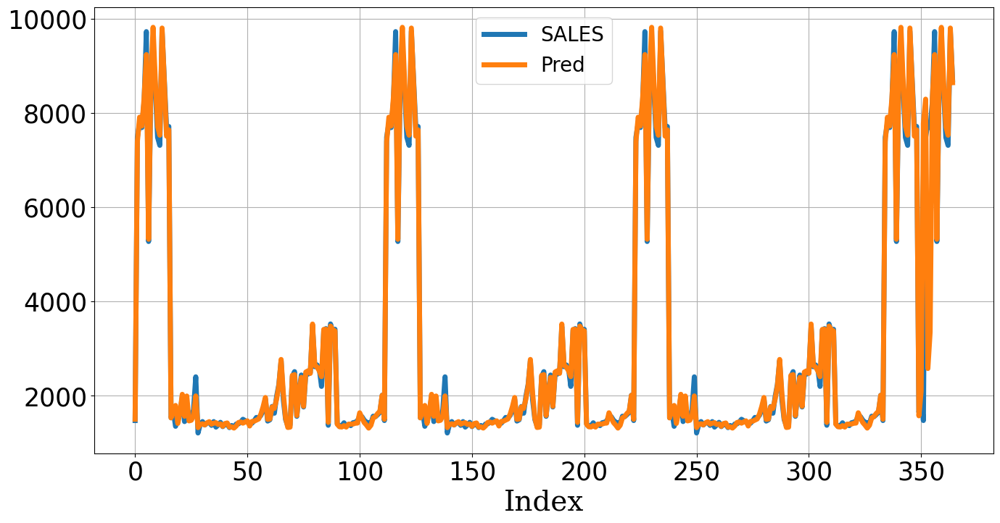

,MAE,MSE,MAPE
Train,67.06,"14,860.47",0.03
Test,118.00,"251,355.61",0.04


In [49]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## LSTM

<center><img src='Image/Expert/DL_RNN_Operation.png' width='700'>(http://colah.github.io/posts/2015-08-Understanding-LSTMs/)</center>

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0
origin X:  (2191, 16) -> reshape X:  (2185, 7, 16)
origin Y:  (2191, 1) -> reshape Y:  (2185, 1)
X_train: (1820, 7, 16) Y_train: (1820, 1)
X_test: (365, 7, 16) Y_test: (365, 1)


Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 7, 16)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 7, 128)         │        74,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 7, 64)          │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 448)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 1)              │           449 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 124,097 (484.75 KB)

 Trainable params: 124,097 (484.75 KB)

 Non-trainable params: 0 (0.00 B)

2025-04-07 23:33:23.584201: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_78', 100 bytes spill stores, 100 bytes spill loads

2025-04-07 23:33:23.596075: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_78', 128 bytes spill stores, 128 bytes spill loads

2025-04-07 23:33:23.631701: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_78', 24 bytes spill stores, 24 bytes spill loads

2025-04-07 23:33:26.472337: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_78', 100 bytes spill stores, 100 bytes spill loads

2025-04-07 23:33:26.647687: I external/local_xla/xla/stream_ex

Epoch 61: early stopping


Training Progress:  20%|████████████▊                                                  | 61/300 [00:23<01:30,  2.63it/s]


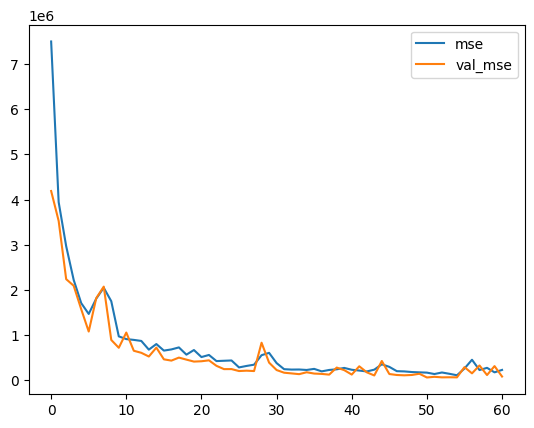

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step  
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


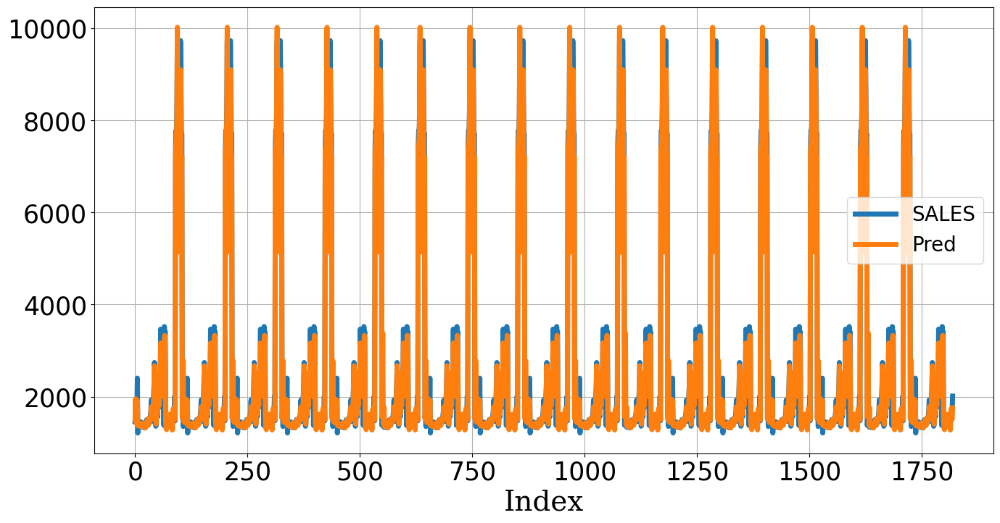

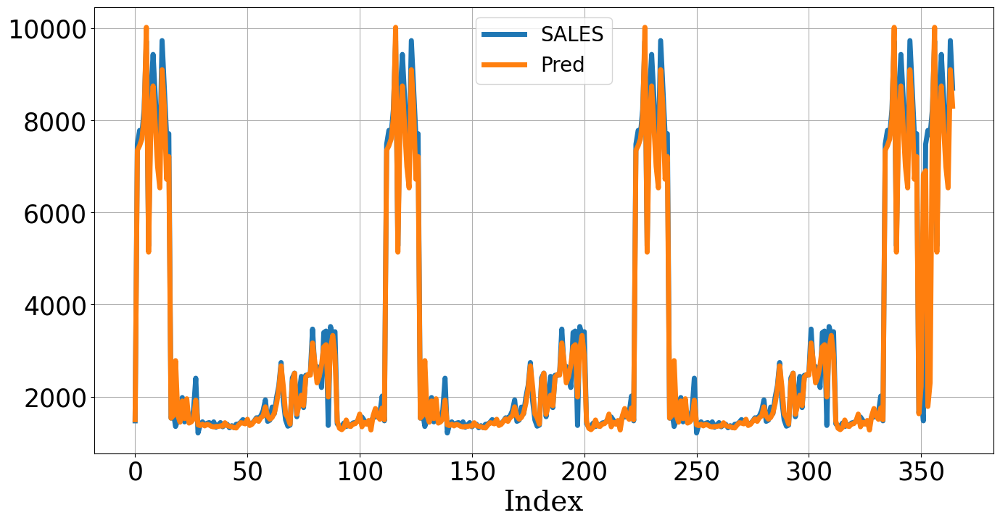

,MAE,MSE,MAPE
Train,172.62,"83,087.01",0.07
Test,236.72,"349,630.26",0.08


In [50]:
# 하이퍼파라미터
SEQUENCE=7
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 300
VERBOSE = 0
################
EARLYSTOP_PATIENT = 10
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','MarketingSales_LSTM.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)

# Reshape
X, Y = reshape_2Dto3Dseq(np.concatenate((X_train, X_test), axis=0),
                         pd.concat([Y_train, Y_test], axis=0), SEQUENCE)
test_length = Y_test.shape[0]
X_train, Y_train = X[:-test_length,:,:], Y.iloc[:-test_length,:]
X_test, Y_test = X[-test_length:,:,:], Y.iloc[-test_length:,:]
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
hiddens = LSTM(128, return_sequences=True, 
               activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = LSTM(64, return_sequences=True, 
               activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step  
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


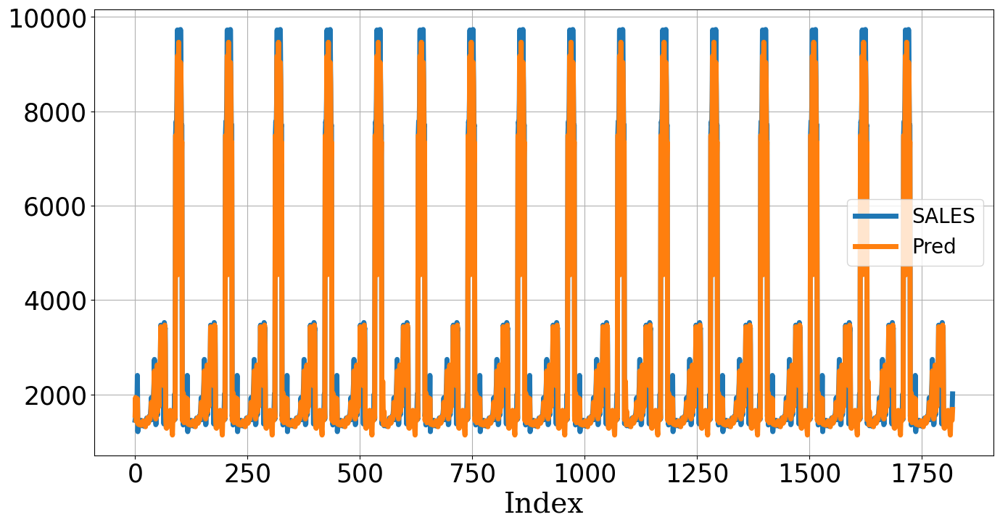

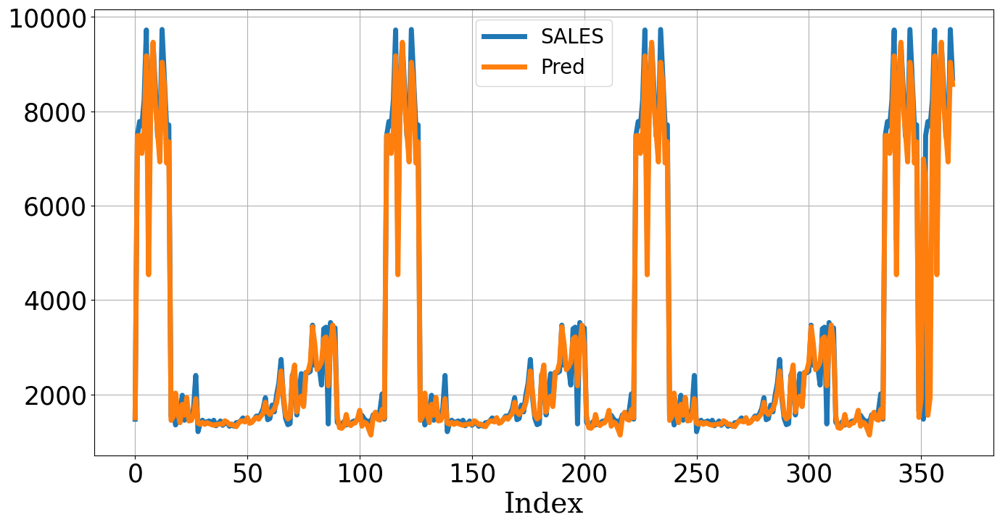

,MAE,MSE,MAPE
Train,163.03,"62,241.85",0.07
Test,225.87,"354,084.95",0.08


In [51]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## GRU

<center><img src='Image/Expert/DL_LSTM_GRU.png' width='700'>(https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21)</center>

---------------train----------------
normalized X:  (1826, 16) 0.0 1.0
----------------test----------------
normalized X:  (365, 16) 0.0 1.0
origin X:  (2191, 16) -> reshape X:  (2185, 7, 16)
origin Y:  (2191, 1) -> reshape Y:  (2185, 1)
X_train: (1820, 7, 16) Y_train: (1820, 1)
X_test: (365, 7, 16) Y_test: (365, 1)


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 7, 16)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_2 (GRU)                     │ (None, 7, 128)         │        56,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_3 (GRU)                     │ (None, 7, 64)          │        37,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 448)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 1)              │           449 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 93,761 (366.25 KB)

 Trainable params: 93,761 (366.25 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  13%|████████▍                                                      | 40/300 [00:17<01:01,  4.24it/s]

Epoch 40: early stopping


Training Progress:  13%|████████▍                                                      | 40/300 [00:17<01:56,  2.23it/s]


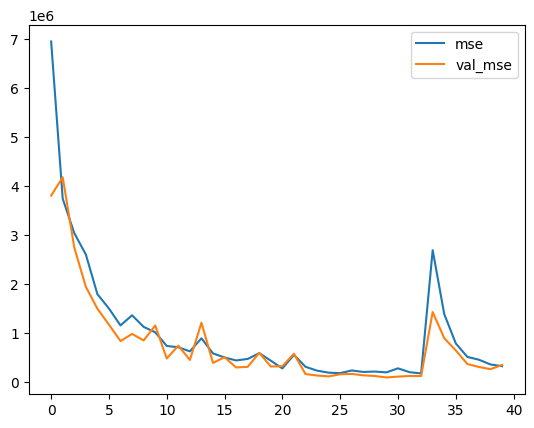

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step  
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


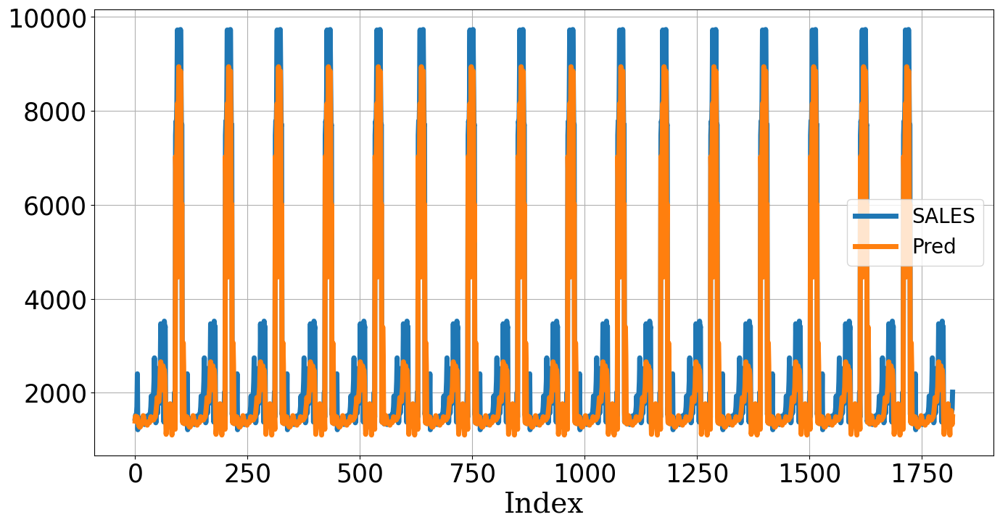

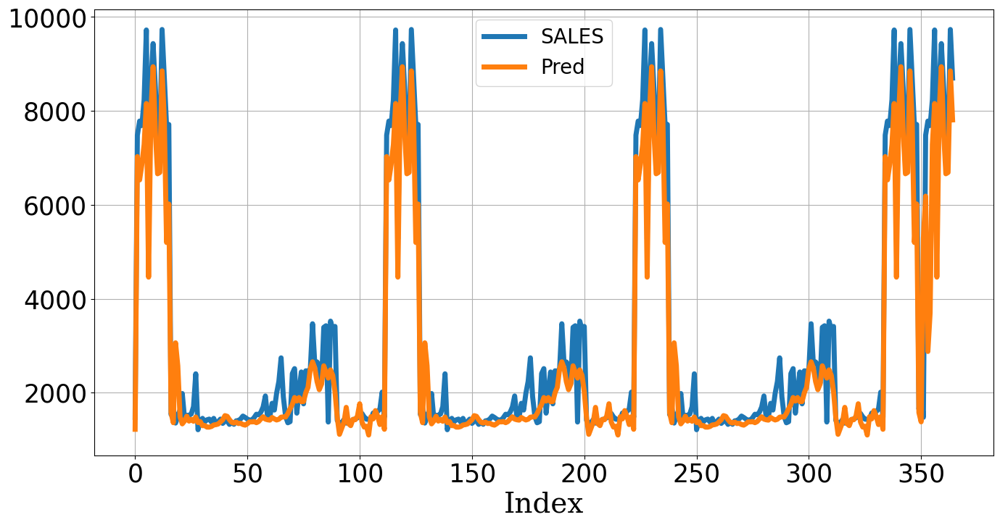

,MAE,MSE,MAPE
Train,387.94,"352,287.01",0.15
Test,461.41,"553,489.04",0.15


In [52]:
# 하이퍼파라미터
SEQUENCE=7
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 64
EPOCHS = 300
VERBOSE = 0
################
EARLYSTOP_PATIENT = 10
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','MarketingSales_GRU.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','ChinaTelecomMarketingMix','MMM_data.csv')
df = pd.read_csv(location)

# 데이터 전처리
X_train, X_test, Y_train, Y_test = preprocessing_MarketingSales(df)

# Reshape
X, Y = reshape_2Dto3Dseq(np.concatenate((X_train, X_test), axis=0),
                         pd.concat([Y_train, Y_test], axis=0), SEQUENCE)
test_length = Y_test.shape[0]
X_train, Y_train = X[:-test_length,:,:], Y.iloc[:-test_length,:]
X_test, Y_test = X[-test_length:,:,:], Y.iloc[-test_length:,:]
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
hiddens = GRU(128, return_sequences=True, 
              activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = GRU(64, return_sequences=True, 
              activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step  
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


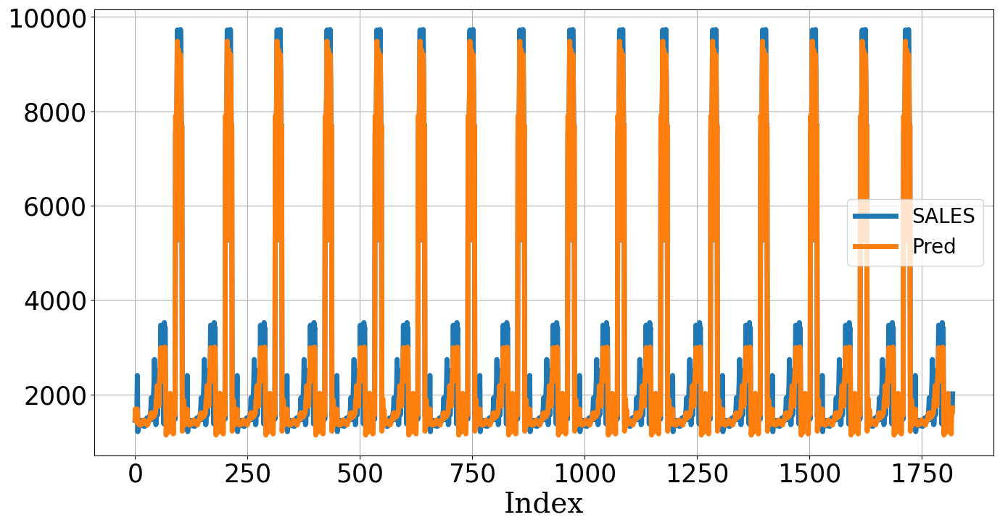

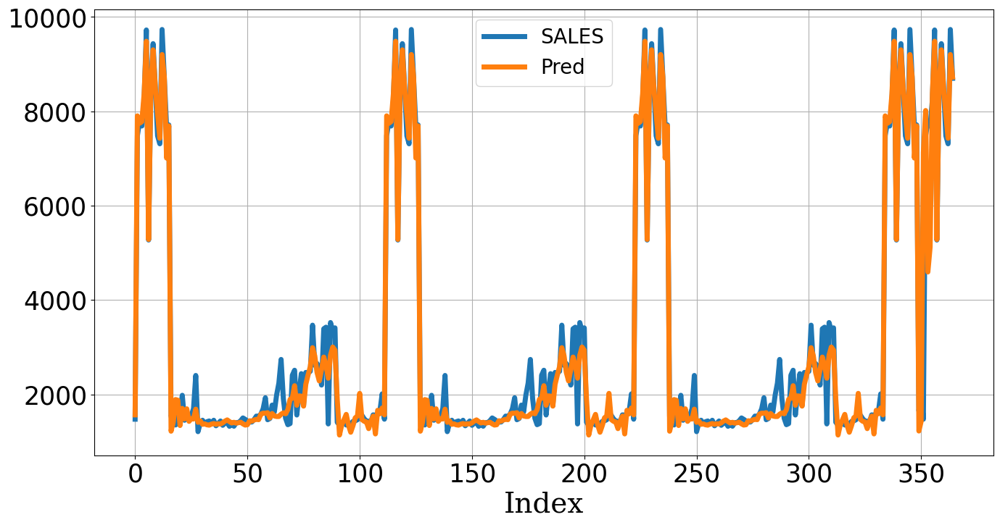

,MAE,MSE,MAPE
Train,205.21,"93,401.53",0.10
Test,235.03,"225,340.92",0.10


In [53]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## Result Summary

MLP
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step 
CNN
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step 
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step 
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step 
12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step 


,MAE,MSE,MAPE
MLP,460.49,"518,192.51",0.18
CNN,269.34,"127,929.66",0.12
RNN,118.00,"251,355.61",0.04
LSTM,225.87,"354,084.95",0.08
GRU,235.03,"225,340.92",0.10


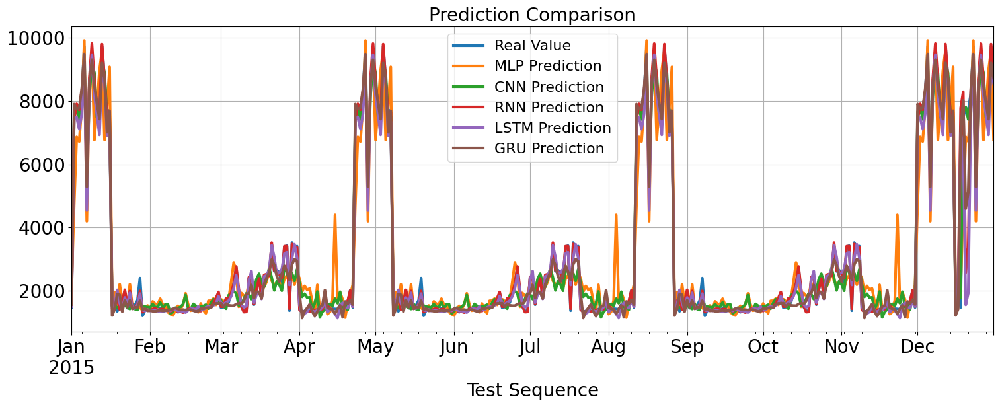

In [54]:
# 저장 모델 불러오기
modelnames = ['MLP', 'CNN', 'RNN', 'LSTM', 'GRU']

# 결과 정리
Y_pred, Score_final = Y_test.copy(), pd.DataFrame()
for each in modelnames:
    FILENAME = os.path.join(os.getcwd(),'Model','MarketingSales_'+each+'.keras')
    
    # 베스트 모델 로딩
    model = load_model(FILENAME)
    
    ## 예측하기
    if each in ['MLP', 'CNN']:
        print(each)
        Y_tepred = pd.DataFrame(model.predict(X_teprep2D), 
                                index=Y_teprep2D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg( Y_teprep2D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
    else:
        Y_tepred = pd.DataFrame(model.predict(X_teprep3D), 
                                index=Y_teprep3D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg(Y_teprep3D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
  
# 정리
Y_pred.columns = ['Real Value']+[i+' Prediction' for i in modelnames]
Score_final.index = modelnames
    
# 결과 출력
display(Score_final)
Y_pred.plot(kind='line', figsize=(18,6), linewidth=3, fontsize=20,
            xlim=(Y_pred.index.min(),Y_pred.index.max()))
plt.title('Prediction Comparison', fontsize=20)
plt.xlabel('Test Sequence', fontsize=20)
plt.ylabel('', fontsize=20)
plt.legend(fontsize=16)
plt.grid()
plt.show()

# **Problem:** 비트코인가격 예측

| **Date** | **Price** |
|:---:|:---:|
| **2014-09-16** | 457.33 |
| **2014-09-17** | 424.44 |
| **2014-09-18** | 394.8 |
| **2014-09-19** | 408.9 |
| **2014-09-20** | 398.82 |
| **...** | ... |
| **2021-04-23** | 50,050.87 |
| **2021-04-24** | 49,004.25 |
| **2021-04-25** | 54,021.75 |
| **2021-04-26** | 55,033.12 |
| **2021-04-27** | 54,824.70 |

## Data Preprocessing

**1) Many-to-One:**

<center><img src='Image/Expert/Reshape_1Dto2D_ManytoOne.png' width='1100'></center>

---

**2) Many-to-Many:**

<center><img src='Image/Expert/Reshape_1Dto2D_ManytoMany.png' width='1100'></center>

In [55]:
# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

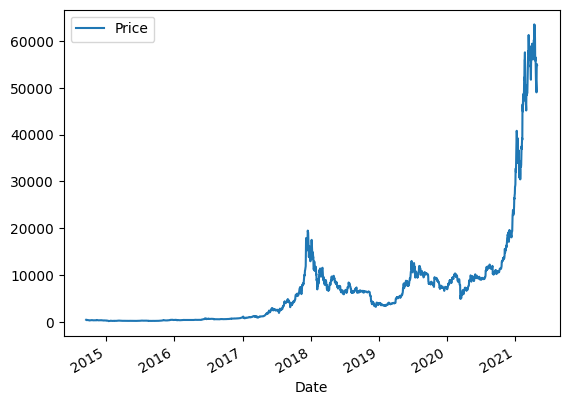

In [56]:
# 비트코인 가격 시각화
df.plot()
plt.show()

In [57]:
# sequence 데이터 추출 및 변환
X_seqleng = 3
Y_seqleng = 2

seq_length = X_seqleng + Y_seqleng
X_reshape, Y_reshape = [], []
for index in range(len(df) - seq_length): # 2D: seq_length+1
    X_reshape.append(np.array(df[index: index + seq_length]))

# arrange
X_reshape = np.array(X_reshape)
X_reshape = pd.DataFrame(X_reshape.reshape(X_reshape.shape[0], -1), 
                         index=df.index[seq_length:])
Y_reshape = X_reshape.iloc[:,-Y_seqleng:]
X_reshape = X_reshape.iloc[:,:-Y_seqleng]
print('origin DF: ', df.shape, '-> reshape X: ', X_reshape.shape, '+ reshape Y: ', Y_reshape.shape)

origin DF:  (2412, 1) -> reshape X:  (2407, 3) + reshape Y:  (2407, 2)


In [58]:
# reshape 함수화
def reshape_1Dto2Dseq(df, X_seqleng, Y_seqleng):
    # generate sequence
    seq_length = X_seqleng + Y_seqleng
    X_reshape, Y_reshape = [], []
    for index in range(len(df) - seq_length): # 2D: seq_length+1
        X_reshape.append(np.array(df[index: index + seq_length]))

    # arrange
    X_reshape = np.array(X_reshape)
    X_reshape = pd.DataFrame(X_reshape.reshape(X_reshape.shape[0], -1), 
                             index=df.index[seq_length:])
    X_reshape.columns = [df.columns[0]+'_t'+str(i) for i in range(seq_length)]
    Y_reshape = X_reshape.iloc[:,-Y_seqleng:]
    X_reshape = X_reshape.iloc[:,:-Y_seqleng]
    print('origin DF: ', df.shape, '-> reshape X: ', X_reshape.shape, '+ reshape Y: ', Y_reshape.shape)
    
    return X_reshape, Y_reshape

X_SEQUENCE=7
Y_SEQUENCE=1
X, Y = reshape_1Dto2Dseq(df, X_seqleng=X_SEQUENCE, Y_seqleng=Y_SEQUENCE)

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)


In [59]:
# train & test 형태 변경
test_criteria = '2021-01-01'
X_train, Y_train = X.loc[X.index < test_criteria,:], Y.loc[Y.index < test_criteria,:]
X_test, Y_test = X.loc[X.index >= test_criteria,:], Y.loc[Y.index >= test_criteria,:]
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)
## 데이터 백업
X_trprep2D, X_teprep2D = X_train.copy(), X_test.copy()
Y_trprep2D, Y_teprep2D = Y_train.copy(), Y_test.copy()

X_train: (2286, 7) Y_train: (2286, 1)
X_test: (118, 7) Y_test: (118, 1)


## MLP

<center><img src='Image/Expert/DL_MLP_Custom.PNG' width='500'></center>

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)
X_train: (2286, 7) Y_train: (2286, 1)
X_test: (118, 7) Y_test: (118, 1)


Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 7)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 128)            │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,393 (44.50 KB)

 Trainable params: 11,393 (44.50 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  26%|████████████████▋                                              | 53/200 [00:19<00:46,  3.15it/s]

Epoch 53: early stopping


Training Progress:  26%|████████████████▋                                              | 53/200 [00:19<00:53,  2.73it/s]


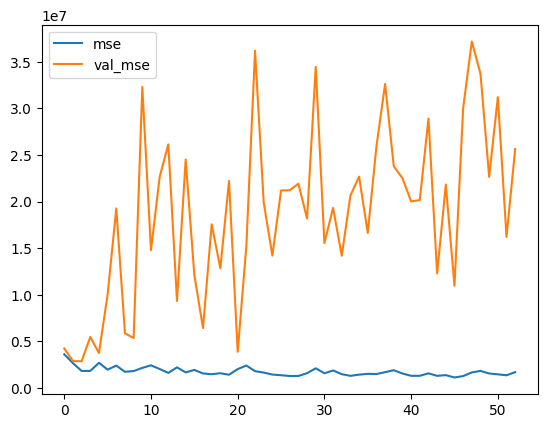

72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step  
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step


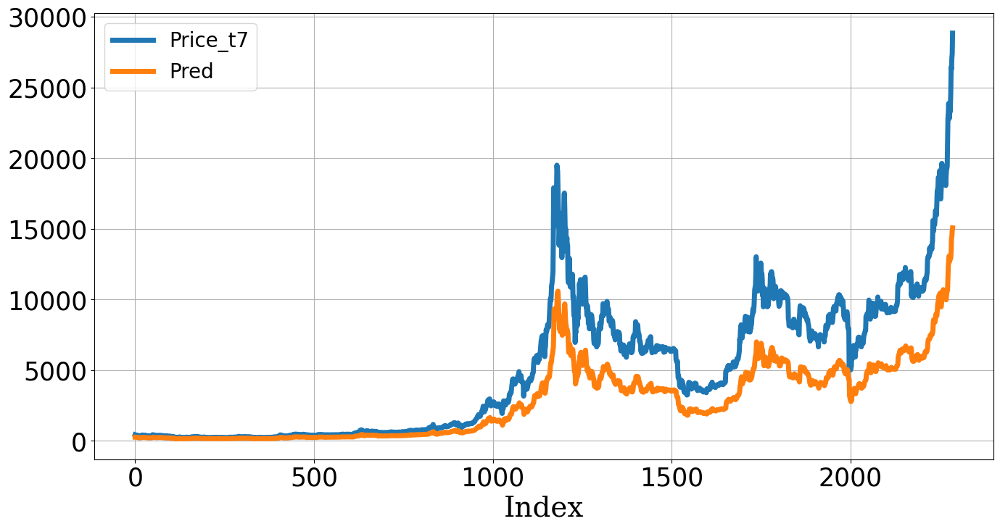

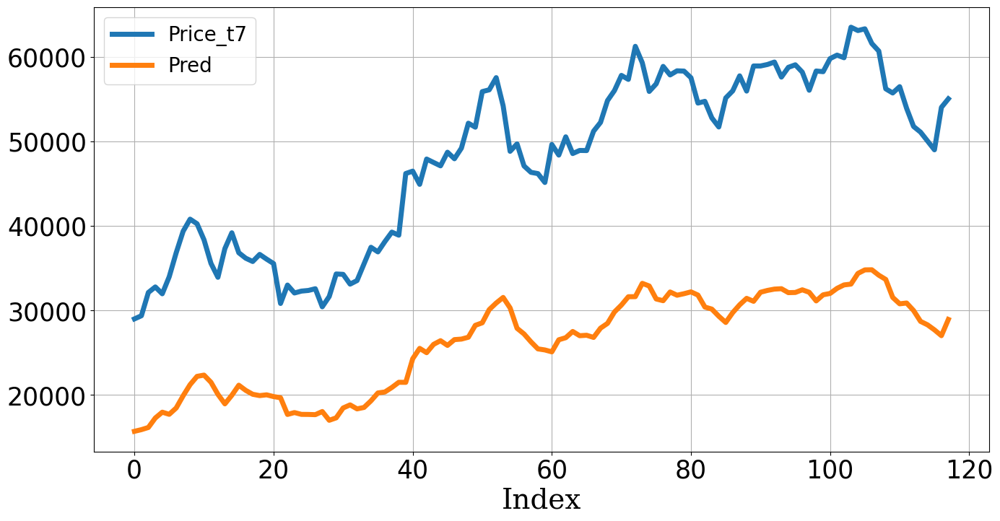

,MAE,MSE,MAPE
Train,"2,206.85","9,680,451.24",0.43
Test,"21,704.00","493,454,683.32",0.45


In [60]:
# 하이퍼파라미터
X_SEQUENCE=7
Y_SEQUENCE=1
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 200
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BitcoinPrice_MLP.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

# Reshape
X, Y = reshape_1Dto2Dseq(df, X_seqleng=X_SEQUENCE, Y_seqleng=Y_SEQUENCE)
TEST_CRITERIA = '2021-01-01'
X_train, Y_train = X.loc[X.index < TEST_CRITERIA,:], Y.loc[Y.index < TEST_CRITERIA,:]
X_test, Y_test = X.loc[X.index >= TEST_CRITERIA,:], Y.loc[Y.index >= TEST_CRITERIA,:]
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1],))   
hiddens = Dense(128, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(64, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION, kernel_regularizer=REGULARIZER)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step   
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


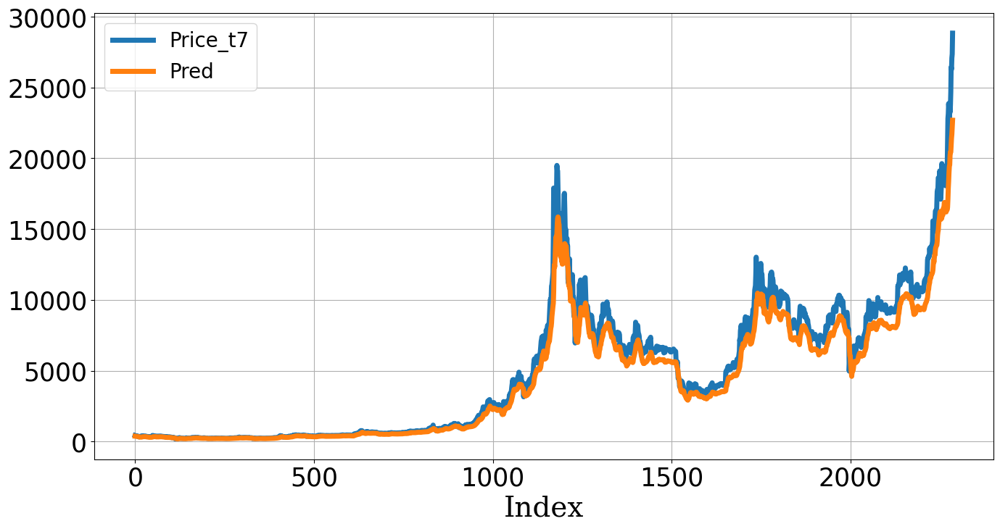

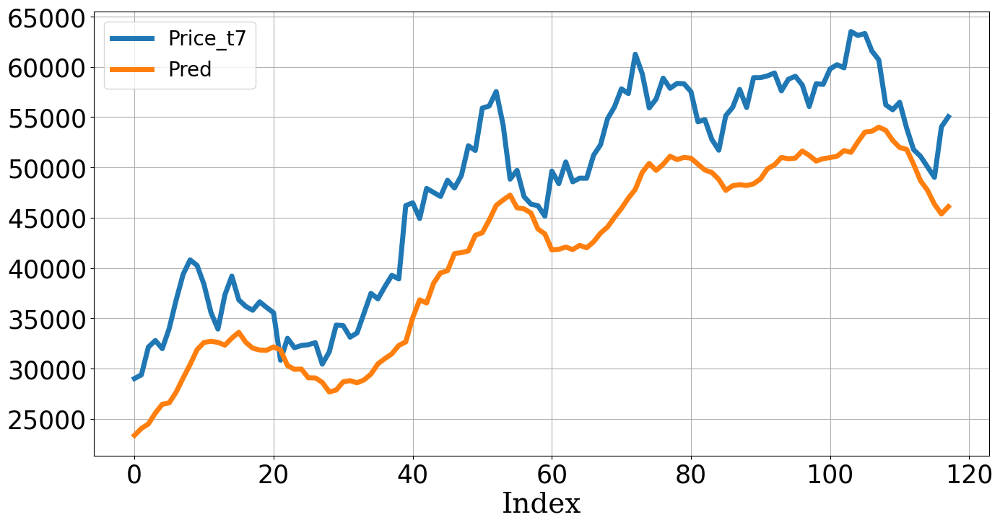

,MAE,MSE,MAPE
Train,663.85,"1,071,871.75",0.13
Test,"6,680.37","53,874,530.34",0.14


In [61]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## CNN

<center><img src='Image/Expert/CNN_Example.webp' width='900'></center>

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)
X_train: (2286, 7, 1) Y_train: (2286, 1)
X_test: (118, 7, 1) Y_test: (118, 1)


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 7, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_4 (Conv1D)               │ (None, 7, 128)         │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_4 (MaxPooling1D)  │ (None, 3, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 3, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_5 (Conv1D)               │ (None, 3, 64)          │        24,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_5 (MaxPooling1D)  │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,265 (106.50 KB)

 Trainable params: 27,265 (106.50 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  54%|█████████████████████████████████▍                            | 108/200 [00:39<00:30,  3.06it/s]

Epoch 108: early stopping


Training Progress:  54%|█████████████████████████████████▍                            | 108/200 [00:39<00:33,  2.75it/s]


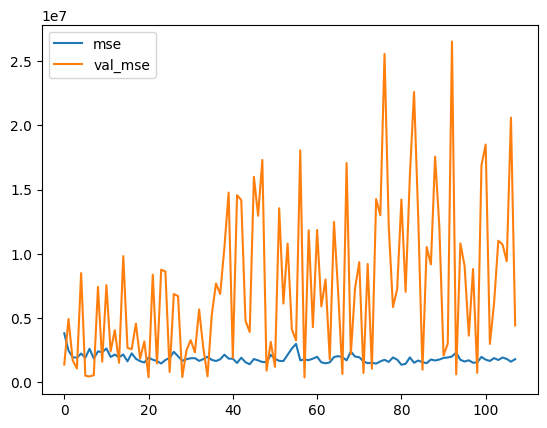

72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step   
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


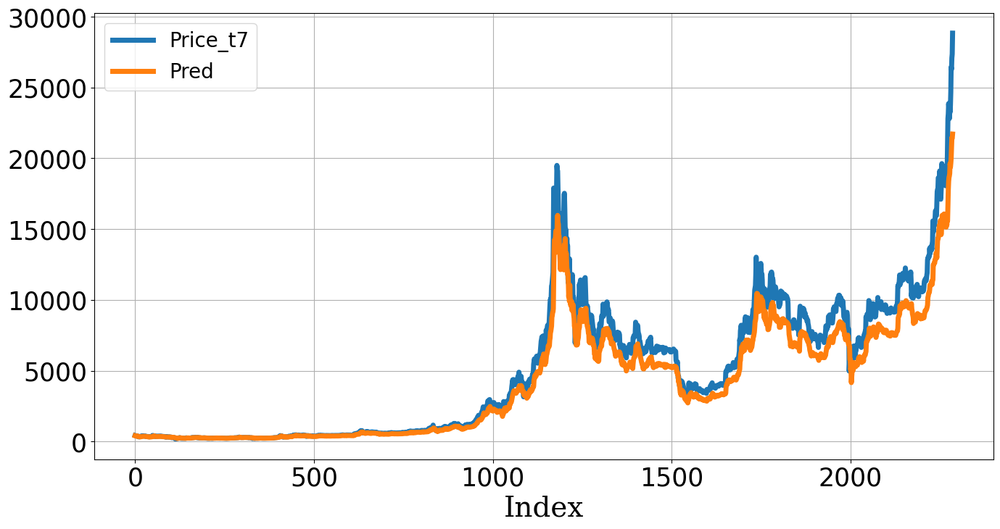

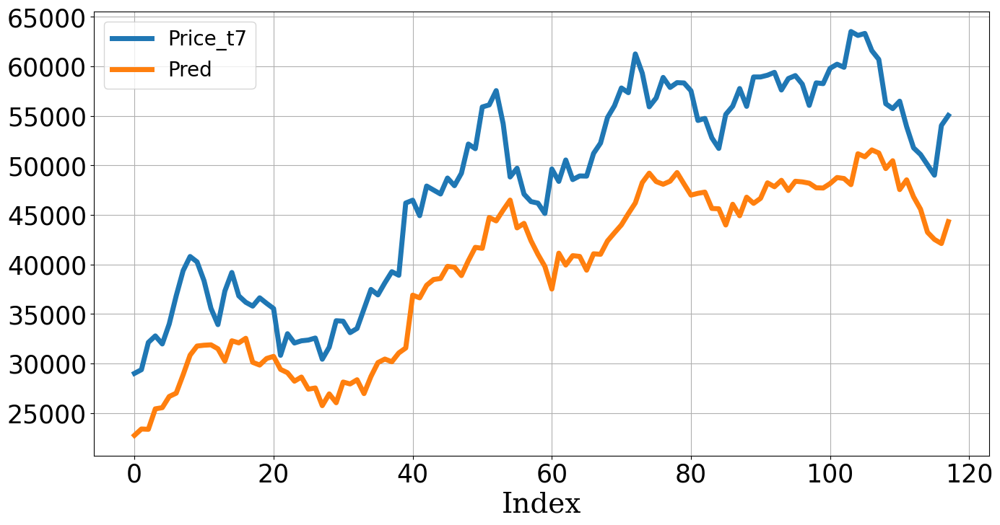

,MAE,MSE,MAPE
Train,827.26,"1,560,839.21",0.13
Test,"8,481.04","80,919,633.09",0.18


In [62]:
# 하이퍼파라미터
X_SEQUENCE=7
Y_SEQUENCE=1
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 200
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BitcoinPrice_CNN.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

# Reshape
X, Y = reshape_1Dto2Dseq(df, X_seqleng=X_SEQUENCE, Y_seqleng=Y_SEQUENCE)
TEST_CRITERIA = '2021-01-01'
X_train, Y_train = X.loc[X.index < TEST_CRITERIA,:], Y.loc[Y.index < TEST_CRITERIA,:]
X_test, Y_test = X.loc[X.index >= TEST_CRITERIA,:], Y.loc[Y.index >= TEST_CRITERIA,:]
X_train = X_train.values.reshape(-1, X_train.shape[1], 1)
X_test = X_test.values.reshape(-1, X_test.shape[1], 1)
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))   
hiddens = Conv1D(128, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(inputs)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Conv1D(64, kernel_size=KERNEL_SIZE, strides=STRIDE, padding=PADDING, 
                 activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = MaxPooling1D(pool_size=POOL_SIZE, strides=POOL_STRIDE)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
hiddens = Dense(32, activation=HIDDEN_ACTIVATION)(hiddens)  
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)  
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step   
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


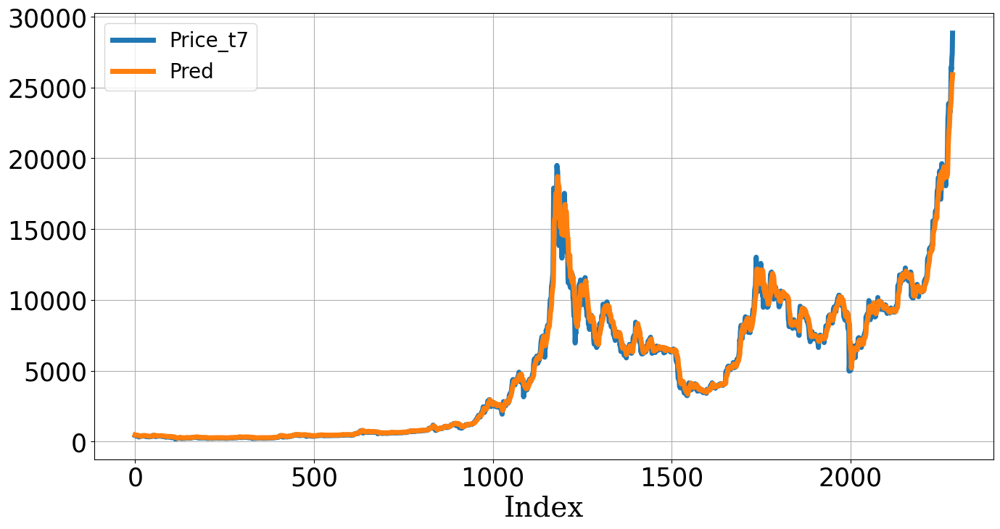

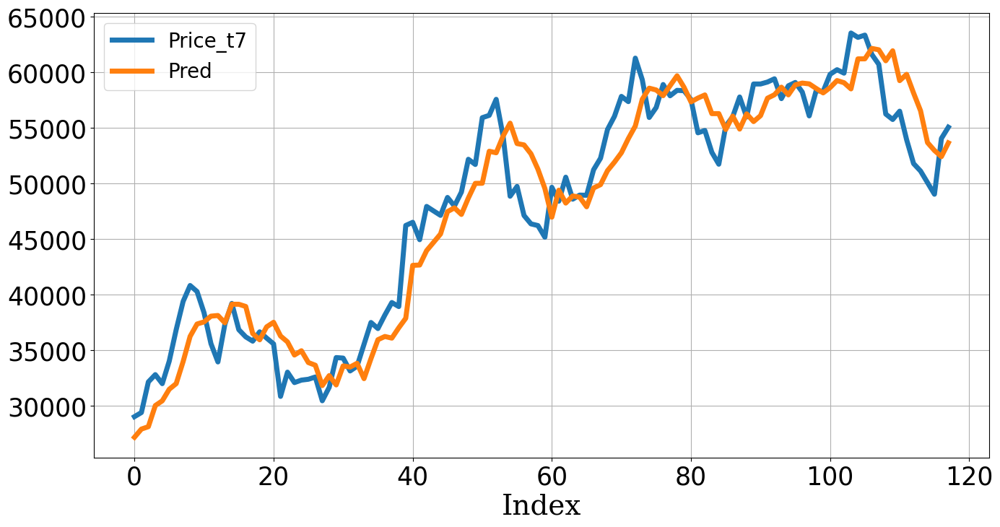

,MAE,MSE,MAPE
Train,232.73,"216,306.91",0.06
Test,"2,509.03","9,642,652.03",0.05


In [63]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## RNN

<center><img src='Image/Expert/DL_RNN_UnfoldFold.PNG' width='600'></center>

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)
X_train: (2286, 7, 1) Y_train: (2286, 1)
X_test: (118, 7, 1) Y_test: (118, 1)


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)     │ (None, 7, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_4 (SimpleRNN)        │ (None, 7, 128)         │        16,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_5 (SimpleRNN)        │ (None, 7, 64)          │        12,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 448)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 1)              │           449 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,441 (115.00 KB)

 Trainable params: 29,441 (115.00 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  62%|██████████████████████████████████████▏                       | 123/200 [00:46<00:25,  3.03it/s]

Epoch 123: early stopping


Training Progress:  62%|██████████████████████████████████████▏                       | 123/200 [00:46<00:29,  2.63it/s]


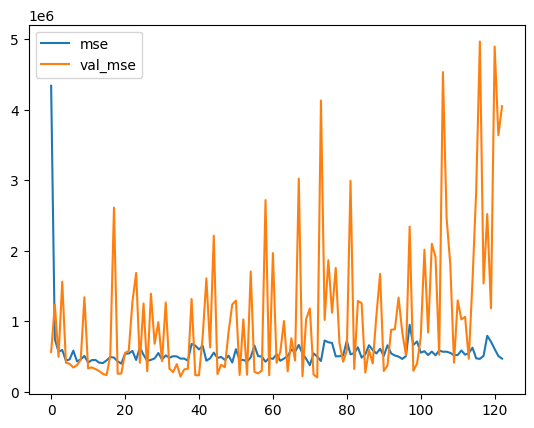

72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step   
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


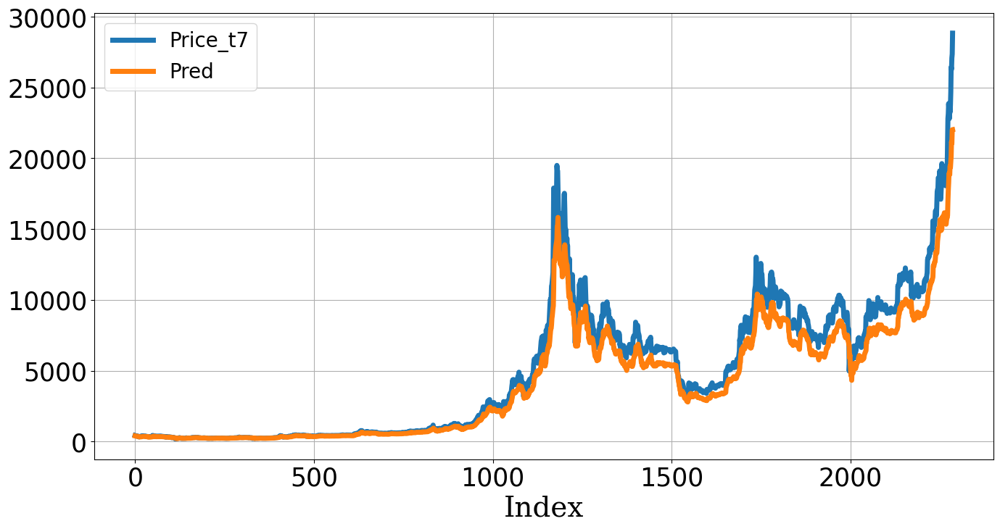

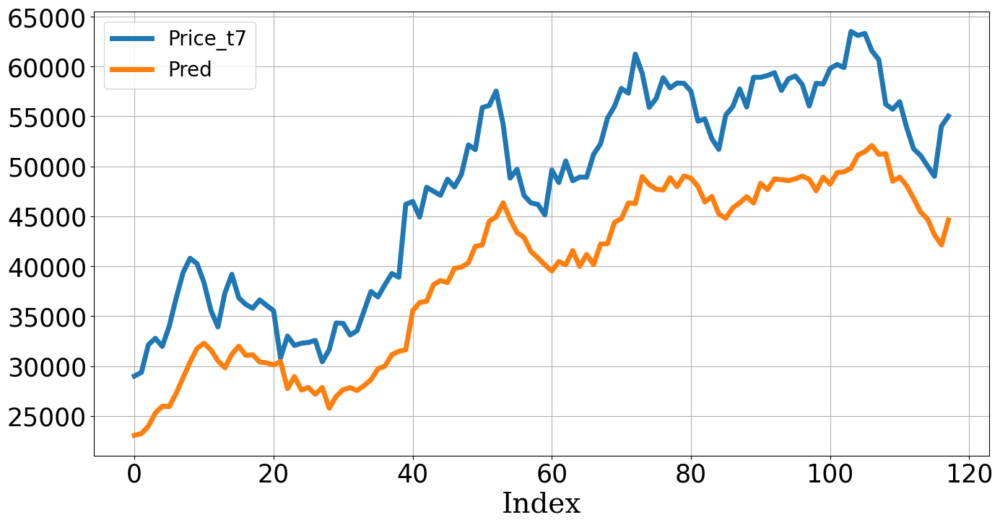

,MAE,MSE,MAPE
Train,809.10,"1,485,381.49",0.13
Test,"8,342.13","77,299,671.38",0.17


In [64]:
# 하이퍼파라미터
X_SEQUENCE=7
Y_SEQUENCE=1
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 200
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BitcoinPrice_RNN.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

# Reshape
X, Y = reshape_1Dto2Dseq(df, X_seqleng=X_SEQUENCE, Y_seqleng=Y_SEQUENCE)
TEST_CRITERIA = '2021-01-01'
X_train, Y_train = X.loc[X.index < TEST_CRITERIA,:], Y.loc[Y.index < TEST_CRITERIA,:]
X_test, Y_test = X.loc[X.index >= TEST_CRITERIA,:], Y.loc[Y.index >= TEST_CRITERIA,:]
X_train = X_train.values.reshape(-1, X_train.shape[1], 1)
X_test = X_test.values.reshape(-1, X_test.shape[1], 1)
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
hiddens = SimpleRNN(128, return_sequences=True, 
                    activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = SimpleRNN(64, return_sequences=True, 
                    activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)
model = Model(inputs, output)  
model.summary() 
plot_model(model)

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

In [65]:
## 데이터 백업
X_trprep3D, X_teprep3D = X_train.copy(), X_test.copy()
Y_trprep3D, Y_teprep3D = Y_train.copy(), Y_test.copy()

72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step   
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


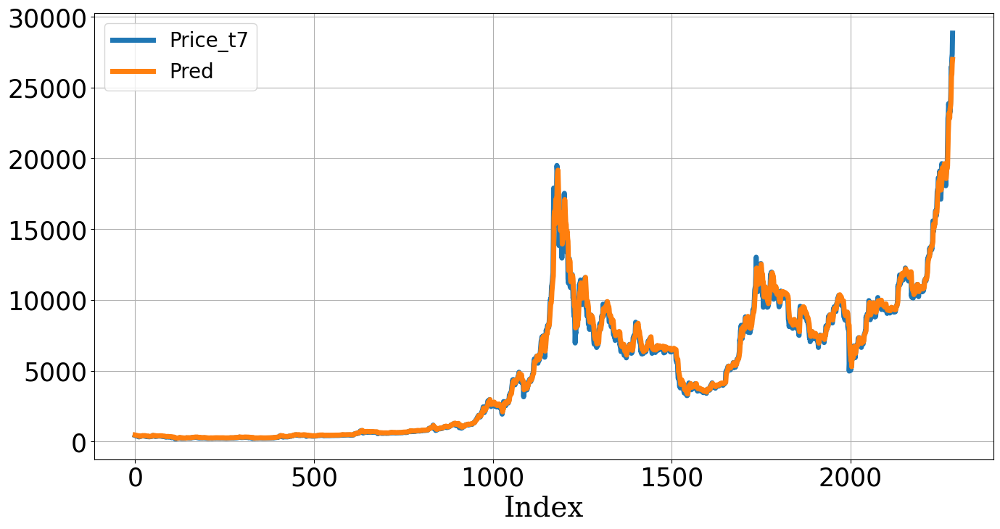

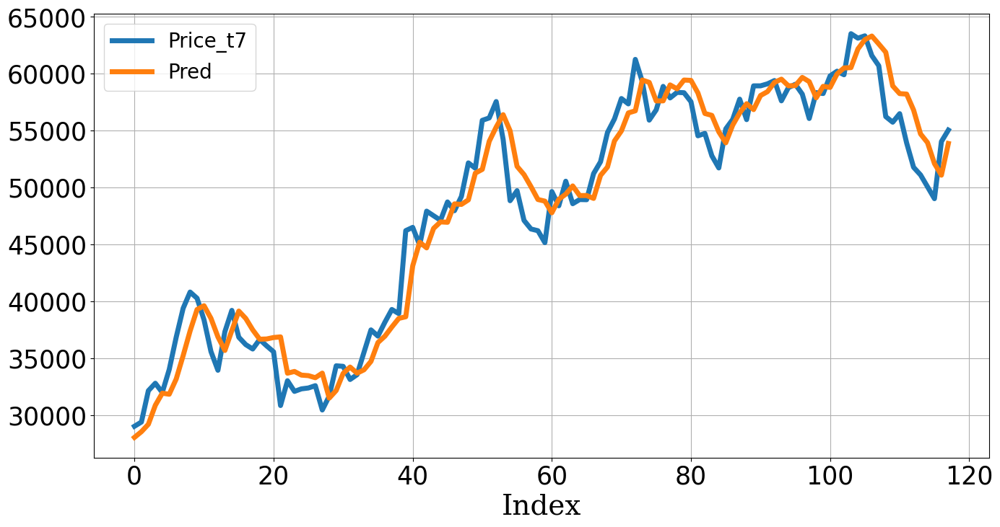

,MAE,MSE,MAPE
Train,185.03,"134,957.16",0.05
Test,"1,928.15","5,892,310.66",0.04


In [66]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## LSTM

<center><img src='Image/Expert/DL_RNN_Operation.PNG' width='700'>(http://colah.github.io/posts/2015-08-Understanding-LSTMs/)</center>

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)
X_train: (2286, 7, 1) Y_train: (2286, 1)
X_test: (118, 7, 1) Y_test: (118, 1)


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 7, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 7, 128)         │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 7, 64)          │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_10 (Flatten)            │ (None, 448)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 1)              │           449 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 116,417 (454.75 KB)

 Trainable params: 116,417 (454.75 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  59%|████████████████████████████████████▌                         | 118/200 [00:45<00:25,  3.20it/s]

Epoch 118: early stopping


Training Progress:  59%|████████████████████████████████████▌                         | 118/200 [00:45<00:31,  2.58it/s]


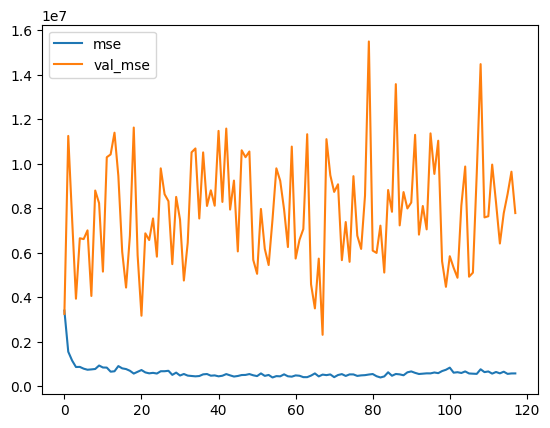

72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step   
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


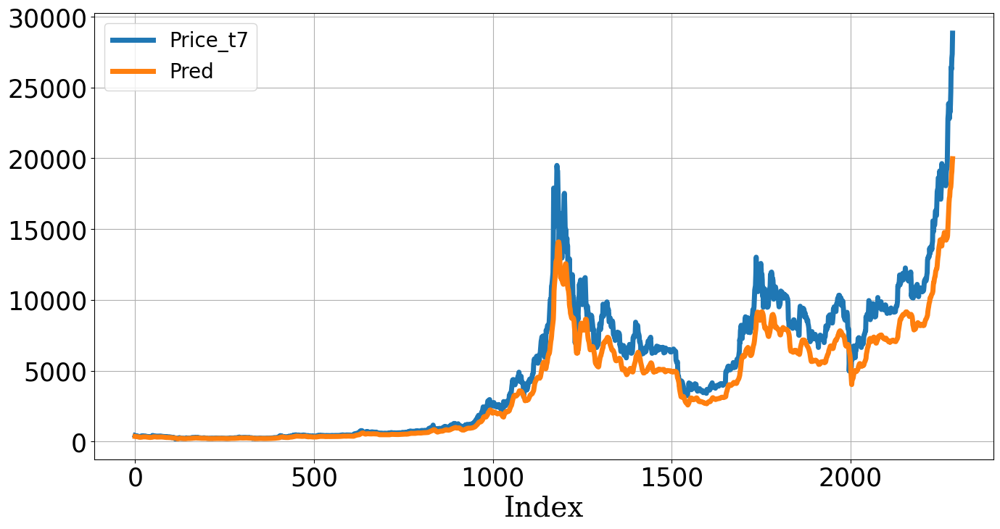

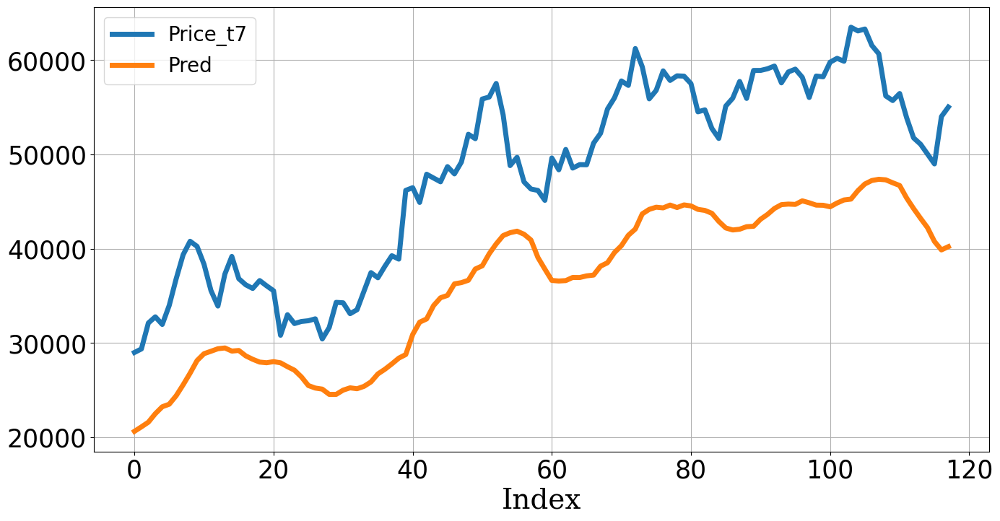

,MAE,MSE,MAPE
Train,"1,141.07","2,855,912.13",0.20
Test,"11,577.94","146,709,454.62",0.24


In [67]:
# 하이퍼파라미터
X_SEQUENCE=7
Y_SEQUENCE=1
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 200
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BitcoinPrice_LSTM.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

# Reshape
X, Y = reshape_1Dto2Dseq(df, X_seqleng=X_SEQUENCE, Y_seqleng=Y_SEQUENCE)
TEST_CRITERIA = '2021-01-01'
X_train, Y_train = X.loc[X.index < TEST_CRITERIA,:], Y.loc[Y.index < TEST_CRITERIA,:]
X_test, Y_test = X.loc[X.index >= TEST_CRITERIA,:], Y.loc[Y.index >= TEST_CRITERIA,:]
X_train = X_train.values.reshape(-1, X_train.shape[1], 1)
X_test = X_test.values.reshape(-1, X_test.shape[1], 1)
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
hiddens = LSTM(128, return_sequences=True, 
               activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = LSTM(64, return_sequences=True, 
               activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step  
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


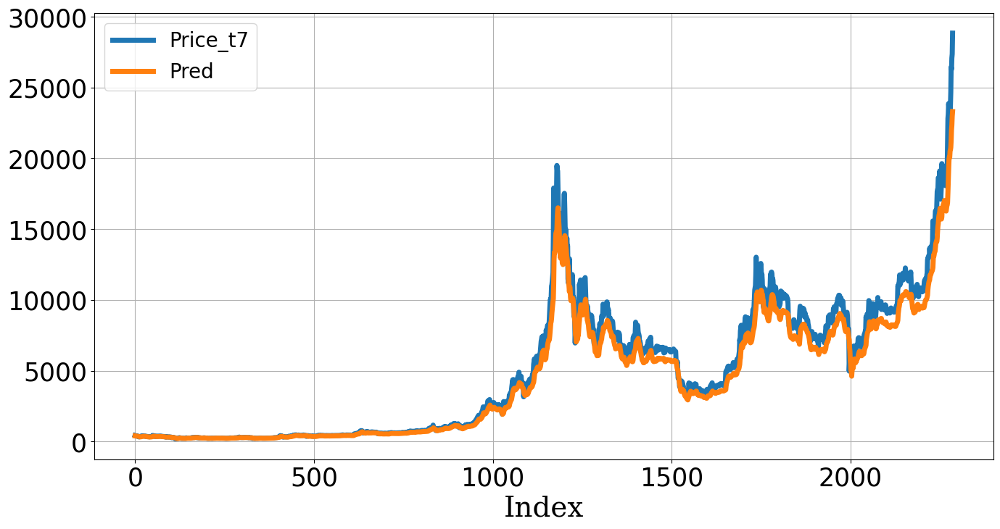

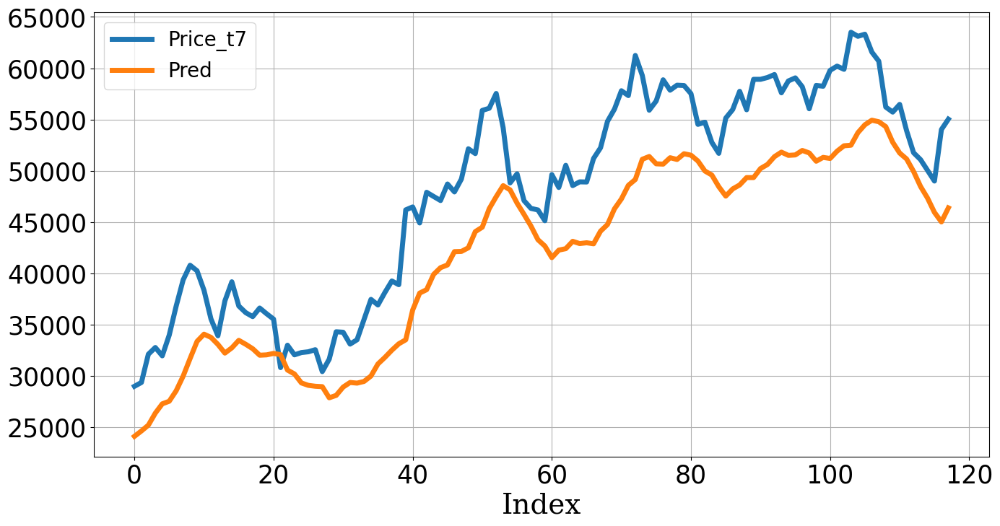

,MAE,MSE,MAPE
Train,590.11,"866,807.50",0.10
Test,"6,091.41","44,351,312.03",0.13


In [68]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## GRU

<center><img src='Image/Expert/DL_LSTM_GRU.png' width='700'>(https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21)</center>

origin DF:  (2412, 1) -> reshape X:  (2404, 7) + reshape Y:  (2404, 1)
X_train: (2286, 7, 1) Y_train: (2286, 1)
X_test: (118, 7, 1) Y_test: (118, 1)


Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (None, 7, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_4 (GRU)                     │ (None, 7, 128)         │        50,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_34 (Dropout)            │ (None, 7, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_5 (GRU)                     │ (None, 7, 64)          │        37,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_35 (Dropout)            │ (None, 7, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_11 (Flatten)            │ (None, 448)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 1)              │           449 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 88,001 (343.75 KB)

 Trainable params: 88,001 (343.75 KB)

 Non-trainable params: 0 (0.00 B)

Training Progress:  30%|███████████████████▏                                           | 61/200 [00:27<00:42,  3.28it/s]

Epoch 61: early stopping


Training Progress:  30%|███████████████████▏                                           | 61/200 [00:27<01:02,  2.21it/s]


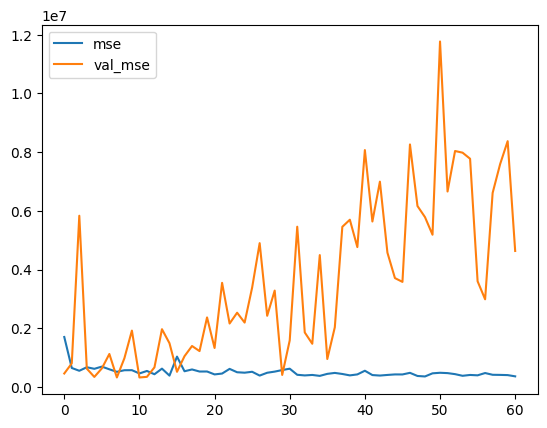

72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step   
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


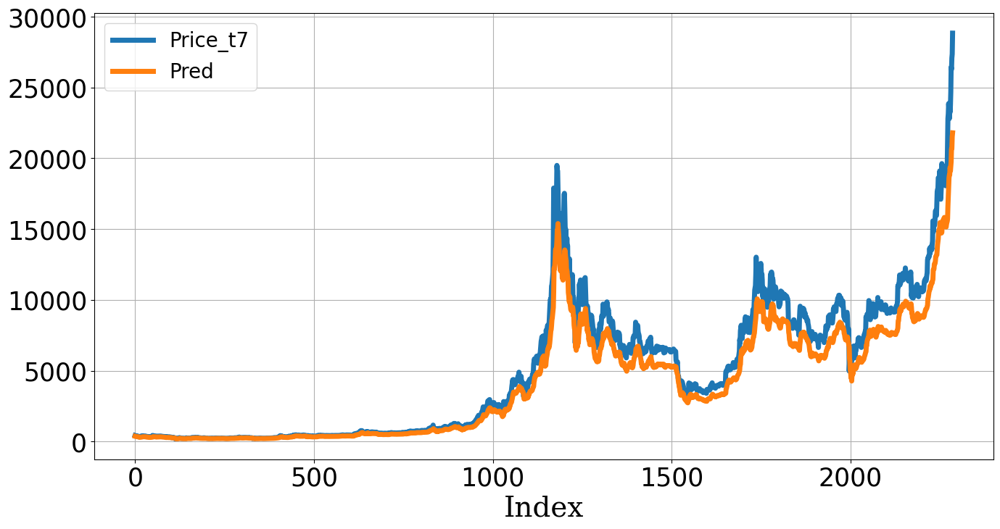

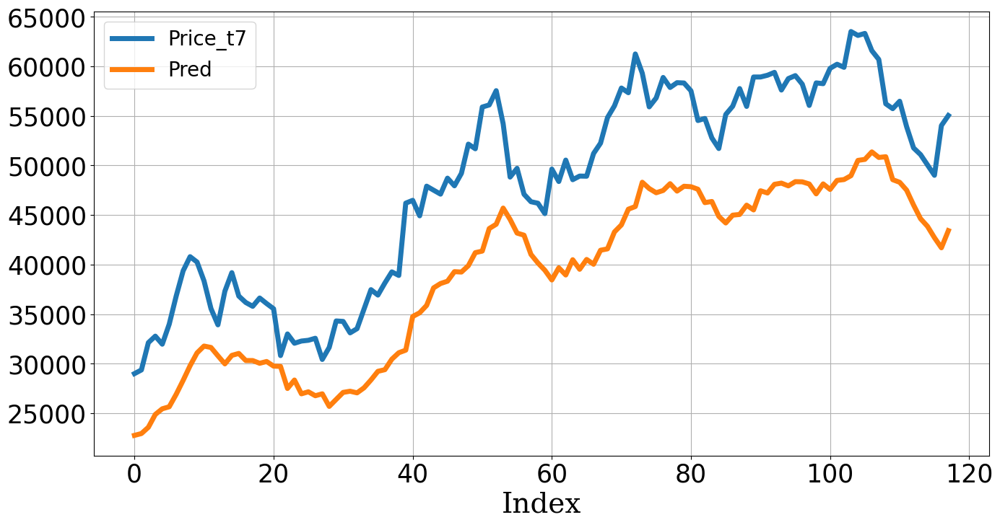

,MAE,MSE,MAPE
Train,885.32,"1,721,602.63",0.16
Test,"8,918.29","87,760,138.29",0.19


In [69]:
# 하이퍼파라미터
X_SEQUENCE=7
Y_SEQUENCE=1
tf.random.set_seed(1)
KERNEL_SIZE = 3
STRIDE = 1
POOL_SIZE = 2
POOL_STRIDE = 2
PADDING = 'same'
HIDDEN_ACTIVATION = 'relu'
OUTPUT_ACTIVATION = 'linear'
REGULARIZER = regularizers.l2(0.01)
DROPOUT_RATIO = 0.25
LOSS = 'mse'
LEARNING_RATE = 0.01
OPTIMIZER = keras.optimizers.Adam(learning_rate=LEARNING_RATE)
METRICS = ['mse']
BATCH_SIZE = 32
EPOCHS = 200
VERBOSE = 0
################
EARLYSTOP_PATIENT = 50
class TQDMProgressBar(callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.epochs_pbar = tqdm(total=self.params['epochs'], desc='Training Progress', position=0, leave=True)

    def on_epoch_end(self, epoch, logs=None):
        self.epochs_pbar.update(1)

    def on_train_end(self, logs=None):
        self.epochs_pbar.close()
MONITOR = 'val_loss'
FILENAME = os.path.join(os.getcwd(),'Model','BitcoinPrice_GRU.keras')
CALLBACK = [callbacks.EarlyStopping(monitor=MONITOR, mode='min', patience=EARLYSTOP_PATIENT, verbose=1), 
            TQDMProgressBar(),
            callbacks.ModelCheckpoint(monitor=MONITOR, mode='min', save_best_only=True, 
                                      filepath=FILENAME)]
################

# Data Loading
location = os.path.join(os.getcwd(),'Data','CryptoCurrency','Bitcoin.csv')
df = pd.read_csv(location, index_col='Date')
df.index = pd.to_datetime(df.index)
df = df[['Close']].copy()
df.columns = ['Price']

# Reshape
X, Y = reshape_1Dto2Dseq(df, X_seqleng=X_SEQUENCE, Y_seqleng=Y_SEQUENCE)
TEST_CRITERIA = '2021-01-01'
X_train, Y_train = X.loc[X.index < TEST_CRITERIA,:], Y.loc[Y.index < TEST_CRITERIA,:]
X_test, Y_test = X.loc[X.index >= TEST_CRITERIA,:], Y.loc[Y.index >= TEST_CRITERIA,:]
X_train = X_train.values.reshape(-1, X_train.shape[1], 1)
X_test = X_test.values.reshape(-1, X_test.shape[1], 1)
print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)

# 네트워크 구축
inputs = Input(shape=(X_train.shape[1], X_train.shape[2]))
hiddens = GRU(128, return_sequences=True, 
              activation=HIDDEN_ACTIVATION)(inputs)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = GRU(64, return_sequences=True, 
              activation=HIDDEN_ACTIVATION)(hiddens)
hiddens = Dropout(DROPOUT_RATIO)(hiddens)
hiddens = Flatten()(hiddens)
output = Dense(1, activation=OUTPUT_ACTIVATION)(hiddens)
model = Model(inputs, output)  
model.summary() 
plot_model(model) 

## 데이터 학습하기
model.compile(loss=LOSS, optimizer=OPTIMIZER, metrics=METRICS)
model_fit = model.fit(X_train, Y_train, validation_split=0.2,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, verbose=VERBOSE,
                      callbacks=CALLBACK)
plt.plot(pd.DataFrame(model_fit.history[METRICS[0]]))
plt.plot(pd.DataFrame(model_fit.history['val_'+METRICS[0]]))
plt.legend([METRICS[0], 'val_'+METRICS[0]])
plt.show()

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

72/72 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step   
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


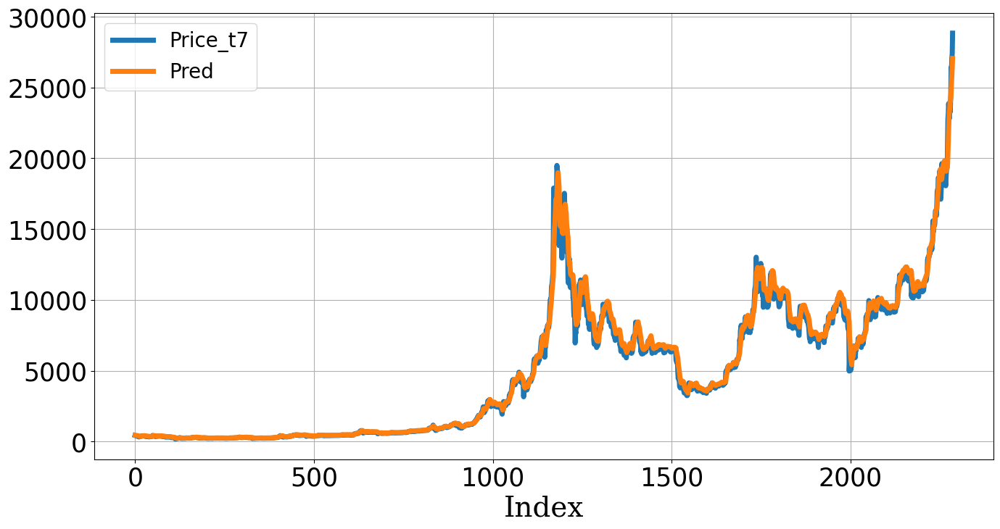

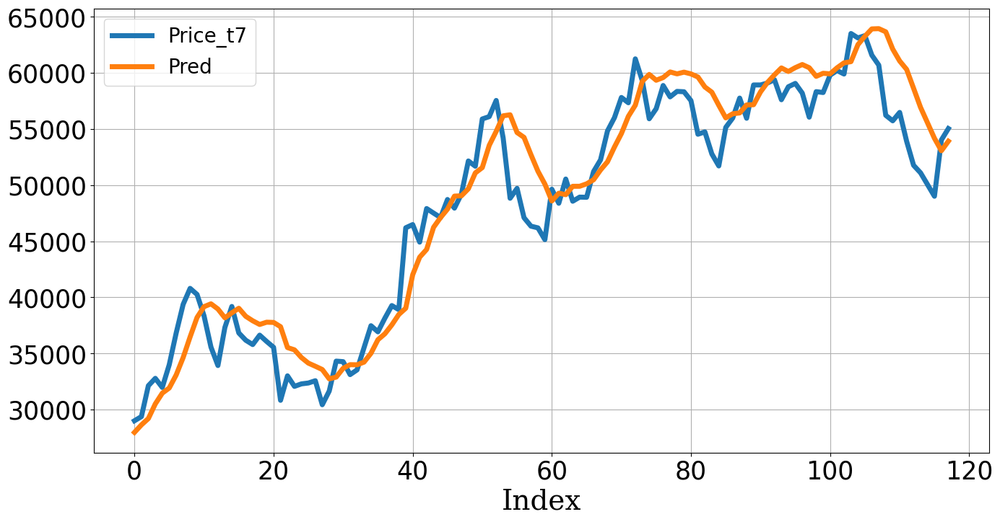

,MAE,MSE,MAPE
Train,244.41,"214,050.84",0.05
Test,"2,465.19","9,842,769.45",0.05


In [70]:
# 베스트 모델 로딩
model = load_model(FILENAME)

## 예측하기
Y_trpred = pd.DataFrame(model.predict(X_train), 
                        index=Y_train.index, columns=['Pred'])
Y_tepred = pd.DataFrame(model.predict(X_test), 
                        index=Y_test.index, columns=['Pred'])
plot_prediction(pd.concat([Y_train, Y_trpred], axis=1).reset_index().iloc[:,1:])
plot_prediction(pd.concat([Y_test, Y_tepred], axis=1).reset_index().iloc[:,1:])

# 분석 검증
Score_nn_early = evaluation_reg_trte(Y_train, Y_trpred, Y_test, Y_tepred)
display(Score_nn_early)

## Result Summary

MLP
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step 
CNN
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step


,MAE,MSE,MAPE
MLP,"6,680.37","53,874,530.34",0.14
CNN,"2,509.03","9,642,652.03",0.05
RNN,"1,928.15","5,892,310.66",0.04
LSTM,"6,091.41","44,351,312.03",0.13
GRU,"2,465.19","9,842,769.45",0.05


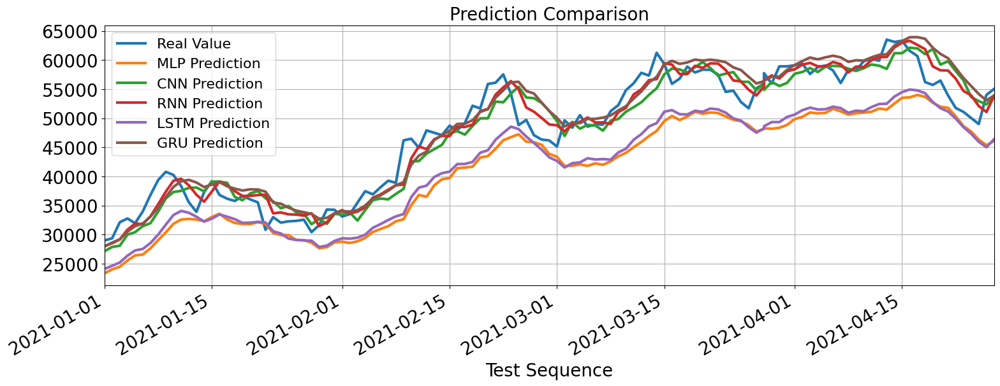

In [71]:
# 저장 모델 불러오기
modelnames = ['MLP', 'CNN', 'RNN', 'LSTM', 'GRU']

# 결과 정리
Y_pred, Score_final = Y_test.copy(), pd.DataFrame()
for each in modelnames:
    FILENAME = os.path.join(os.getcwd(),'Model','BitcoinPrice_'+each+'.keras')
    
    # 베스트 모델 로딩
    model = load_model(FILENAME)
    
    ## 예측하기
    if each in ['MLP', 'CNN']:
        print(each)
        Y_tepred = pd.DataFrame(model.predict(X_teprep2D), 
                                index=Y_teprep2D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg( Y_teprep2D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
    else:
        Y_tepred = pd.DataFrame(model.predict(X_teprep3D), 
                                index=Y_teprep3D.index, columns=['Pred'])
        
        # 분석 검증
        Score_nn_early = evaluation_reg(Y_teprep3D, Y_tepred)
        
        # 결과 붙이기
        Y_pred = pd.concat([Y_pred, Y_tepred], axis=1)
        Score_final = pd.concat([Score_final, Score_nn_early.iloc[[0],:]], axis=0)
  
# 정리
Y_pred.columns = ['Real Value']+[i+' Prediction' for i in modelnames]
Score_final.index = modelnames
    
# 결과 출력
display(Score_final)
Y_pred.plot(kind='line', figsize=(18,6), linewidth=3, fontsize=20,
            xlim=(Y_pred.index.min(),Y_pred.index.max()))
plt.title('Prediction Comparison', fontsize=20)
plt.xlabel('Test Sequence', fontsize=20)
plt.ylabel('', fontsize=20)
plt.legend(fontsize=16)
plt.grid()
plt.show()